In this notebook we are going to perform a Proof of Concept of chemical characterization ad identification using Morgan FIingerprints and Tanimoto similarity

Load packages and set random seeds

In [1]:
def load_jmol_image(cid, dimension=[224,224], zoom=1):
    if USER=='manuel':
        path = f'/home/{USER}/QUAM-AFM/QUAM/JMOL_IMAGES/{cid}/{cid}.png' ##Mustang
    else:
        path = f'/scratch/dataset/quam/JMOL_IMAGES/{cid}/{cid}.png' ##Rocinante
    jmol_image = Image.open(path)
     # Resize image to desired dimensions
    jmol_image = jmol_image.resize(dimension, resample=Image.Resampling.BILINEAR)
    
    
    # Apply zoom by cropping
    width, height = jmol_image.size
    left = width * ((1 - zoom) / 2)
    top = height * ((1 - zoom) / 2)
    right = width * ((1 + zoom) / 2)
    bottom = height * ((1 + zoom) / 2)
    jmol_image = jmol_image.crop((left, top, right, bottom))
    
    # Resize image to desired dimensions
    jmol_image = jmol_image.resize(dimension, resample=Image.Resampling.BILINEAR)
    
    # Convert to numpy array
    jmol_image_array = np.array(jmol_image)
    
    return jmol_image_array


def load_exp_img_stack(path, dimensions=[224,224], zoom=1):
    '''Obtains stack of experimental images from folder path and preprocess 
        it so we can directly feed it to our CNN

        INPUT: path of the folder containing the AFM images of the molecule

        OUTPUT: list of PIL images'''
    path_list = sorted(glob.glob(os.path.join(path,'*')))
    im_list = list()
    for im_path in path_list:
        
        im_list.append(Image.open(im_path).resize(dimensions, resample=Image.Resampling.BILINEAR).convert('L'))
        
    # Default parameters
        degrees = 0
        h_shift = 0
        v_shift = 0
        shear = 0

        
    for i in range(len(im_list)):
        im_list[i] = TF.affine(im_list[i], degrees, [h_shift, v_shift], zoom, shear,
                                interpolation=transforms.InterpolationMode.BILINEAR,
                                fill=im_list[i].getpixel((5, 5))
                                )

    to_tensor = transforms.ToTensor()

    tensor_stack = [to_tensor(im) for im in im_list.copy()]
    tensor_stack = torch.cat(tensor_stack)

    #normalize = transforms.Normalize(
    #    mean=[0.1321, 0.1487, 0.1689, 0.1983, 0.2229, 0.2591, 0.3430, 0.4580, 0.5787, 0.6887],
    #    std=[0.0853, 0.0853, 0.0883, 0.0942, 0.0969, 0.1066, 0.1419, 0.1840, 0.2144, 0.2215]) #this is for K-1



    normalize = transforms.Normalize(
        mean=[0.2855, 0.3973, 0.4424, 0.4134, 0.6759, 1.0664, 0.9904, 0.7708, 0.5748, 0.4055],
        std=[1.1341, 1.2528, 1.3125, 1.3561, 1.5844, 1.7763, 1.5447, 1.2683, 1.0588, 0.9308]) # for all K folders
    
    tensor_stack = normalize(tensor_stack)

    return tensor_stack


def compute_gradcam_figure(path, zoom, threshold, verbose=True):
    exp_img = load_exp_img_stack(path, dimensions = [224,224], zoom=zoom)
    img = exp_img.unsqueeze(0)
    # get the most likely prediction of the model
    pred = model_gradcam(img.to(device))
    fp_pred = (torch.sigmoid(pred) > 0.5).squeeze()

    fp_index_arr = fp_pred.nonzero().detach().cpu().numpy().squeeze()

    mask_list = list()
    if verbose:
        for class_index in tqdm(fp_index_arr):
                mask = np.array(gradcam(model_gradcam, img, class_index, device=device))

                mask = (mask > threshold)*mask
                mask_list.append(mask)
    else:
        for class_index in fp_index_arr:
                mask = np.array(gradcam(model_gradcam, img, class_index, device=device))

                mask = (mask > threshold)*mask
                mask_list.append(mask)

    mask_list = np.array(mask_list)
    mask_mean = mask_list.mean(axis=0)
    mask_normalized = mask_mean/np.max(mask_mean)


    # Convert NumPy array to PIL Image
    image_pil = Image.fromarray((mask_normalized * 255).astype(np.uint8))

    # Resize PIL Image
    new_size = (exp_img.size(2), exp_img.size(2))   # (width, height)
    image_pil_resized = image_pil.resize(new_size)

    # Convert PIL Image back to NumPy array
    image_array_resized = np.array(image_pil_resized)
    
    return exp_img, image_array_resized

In [2]:
# IMPORTS
# torch packages
import torch
import torchvision
import torch.nn as nn
import torch.backends.cudnn as cudnn
import torch.utils.data as data
from torch import optim
from torchvision import datasets, transforms, models
from torchvision.models import resnet50, ResNet50_Weights, efficientnet_b0, EfficientNet_B0_Weights
import torchvision.transforms.functional as TF

from torchmetrics import MetricCollection
from torchmetrics.classification import MultilabelRecall, MultilabelPrecision, MultilabelF1Score

import torch.nn.functional as F
from torch.utils.data import Dataset

print('PyTorch version:', torch.__version__)

# additional packages
from PIL import Image
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import random
import argparse
import os
import time
import glob
from tqdm import tqdm
import scipy
import seaborn as sns
import rdkit.Chem.AllChem as AllChem
import sys
USER = os.getenv('USER')
sys.path.append(f'/home/{USER}/CODE/Pytorch-fingerprints/')

# custom functions
from utils.all_utils import train_test_split, compute_pos_weights, save_config, train_for_epoch, validate, \
                            balance_beta_pos_weights, tanimoto_torch, validate_tanimoto

from utils.models import ResNet3D, resnet_10_chan, effnet_10_chan, eff_net_bias_warmer, resnet_bias_warmer 

from utils.dataloader import QUAM

from utils.screening import fp_screening_function, load_img_stack, predict_fp, tanimoto_numpy



print('Packages loaded')


class configuration:
    def __init__(self):
        # EXPERIMENT PARAMETERS
        self.experiment_name = 'exp_imgs'
        self.n_fp = 1024  # number of fingerprints
        self.output_size = 9
        self.ratio = 0.95  # train/test ratio
        self.seed = 42

        # TRAINING PARAMETERS

        self.lr = 0.001  # learning rate
        self.dropout = 0.5 # Dropout2d probability
        # self.momentum = 0.9  # momentum of SGD optimizer
        self.weight_decay = 0  # L2 regularization constant
        self.batch_size = 50  # Training batch size
        self.test_batch_size = 50  # Test batch size
        self.epochs = 150  # Number of epochs
        self.bias_warmer = True # setting appropiate bias
        self.pos_weight_balancer = True #for bigger fingerprints, it helps balance precision and recall
        self.pos_weight_beta = 10
        # DATA AUGMENTATION PARAMETERS

        # Rotation
        self.rot_prob = 0.5  # prob of rotation in data augmentation
        self.max_deg = 180  # maximum degrees of rotation in data augmentation

        # Zoom
        self.zoom_prob = 0.3  # prob of applying zoom
        self.max_zoom = 0.3  # maximum zooming in/out

        # Translation
        self.shift_prob = 0.3  # probability of vertical or/and horizontal translation
        self.max_shift = 20  # translation

        # Shear
        self.shear_prob = 0.3  # probability of shearing
        self.max_shear = 10  # maximum shearing angle

## Create arguments object
args = configuration()
# Print experiment name
print('Experiment name:', args.experiment_name)

# make sure to enable GPU acceleration!
print(f'available devices: {torch.cuda.device_count()}')
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
#torch.cuda.device(0)
#device = torch.device('cpu')
#print(device, torch.cuda.get_device_name(0))

# Set random seed for reproducibility
torch.backends.cudnn.deterministic = True  # fix the GPU to deterministic mode
torch.manual_seed(args.seed)  # CPU seed
torch.cuda.manual_seed_all(args.seed)  # GPU seed
random.seed(args.seed)  # python seed for image transformation
np.random.seed(args.seed)

PyTorch version: 1.12.1
Packages loaded
Experiment name: exp_imgs
available devices: 1


In [3]:
# Load data
data_path = f'/home/{USER}/QUAM-AFM/datasets/285k_train_15k_val_test_1024bits_df.gz'
dataset_df = pd.read_pickle(data_path)

train_df = dataset_df[dataset_df['split'] == 'train']
test_df = dataset_df[dataset_df['split'] == 'test']

#trainset = QUAM(args, train_df, mode='train')
#train_loader = torch.utils.data.DataLoader(trainset, batch_size=args.batch_size, shuffle=True, num_workers=4,
#                                           pin_memory=True)
#print('Train set samples:', len(trainset))
#
#testset = QUAM(args, test_df.dropna(), mode='test') #dropna for the experimental molecule
#test_loader = torch.utils.data.DataLoader(testset, batch_size=1, shuffle=False, num_workers=4,
#                                          pin_memory=True)
#
#print('Test set samples:', len(testset))

In [4]:
# FOR GPU

# model and metrics initialization

# model = ResNet3D(output_size=args.n_fp)
model = effnet_10_chan(output_size=args.n_fp, dropout=args.dropout)


models_path = f'/home/{USER}/CODE/Pytorch-fingerprints/experiments/300k_1024_all_ks_dropout_0_5/models'
checkpoint = torch.load(os.path.join(models_path, 'checkpoint_5_virtual_epoch_7.pth'))

model.load_state_dict(checkpoint['model_state_dict'])
model = model.to(device)
model.eval()

EfficientNet(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(10, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): Dropout2d(p=0.5, inplace=False)
      (2): SiLU(inplace=True)
    )
    (1): Sequential(
      (0): MBConv(
        (block): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
            (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (2): SiLU(inplace=True)
          )
          (1): SqueezeExcitation(
            (avgpool): AdaptiveAvgPool2d(output_size=1)
            (fc1): Conv2d(32, 8, kernel_size=(1, 1), stride=(1, 1))
            (fc2): Conv2d(8, 32, kernel_size=(1, 1), stride=(1, 1))
            (activation): SiLU(inplace=True)
            (scale_activation): Sigmoid()
          )
          (2): Conv2dNormActivation(
            (0): Conv2d(32, 16, kernel_siz

In [4]:
# FOR CPU

# model and metrics initialization

# model = ResNet3D(output_size=args.n_fp)
model = effnet_10_chan(output_size=args.n_fp, dropout=args.dropout)


models_path = f'/home/{USER}/CODE/Pytorch-fingerprints/experiments/300k_1024_all_ks_dropout_0_5/models'
checkpoint = torch.load(os.path.join(models_path, 'checkpoint_5_virtual_epoch_7.pth'), 
                        map_location=torch.device(device))

model.load_state_dict(checkpoint['model_state_dict'])
model = model.to(device)
model.eval()

EfficientNet(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(10, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): Dropout2d(p=0.5, inplace=False)
      (2): SiLU(inplace=True)
    )
    (1): Sequential(
      (0): MBConv(
        (block): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
            (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (2): SiLU(inplace=True)
          )
          (1): SqueezeExcitation(
            (avgpool): AdaptiveAvgPool2d(output_size=1)
            (fc1): Conv2d(32, 8, kernel_size=(1, 1), stride=(1, 1))
            (fc2): Conv2d(8, 32, kernel_size=(1, 1), stride=(1, 1))
            (activation): SiLU(inplace=True)
            (scale_activation): Sigmoid()
          )
          (2): Conv2dNormActivation(
            (0): Conv2d(32, 16, kernel_siz

Load data

Load model checkpoint

In [5]:
class EfficientNet_GradCAM(nn.Module):
    def __init__(self, pretrained_model):
        super(EfficientNet_GradCAM, self).__init__()

        # Get pretrained model
        self.efficientnet = pretrained_model

        # disect the network to access its last convolutional layer
        self.features_conv = self.efficientnet.features

        # add the average global pool
        self.avg_pool = self.efficientnet.avgpool

        # get the classifier of the vgg19
        self.classifier = self.efficientnet.classifier

        # placeholder for the gradients
        self.gradients = None

    # hook for the gradients of the activations
    def activations_hook(self, grad):
        self.gradients = grad

    def forward(self, x):
        x = self.features_conv(x)

        # register the hook
        h = x.register_hook(self.activations_hook)

        # don't forget the pooling
        x = self.avg_pool(x)
        x = torch.flatten(x, 1)
        x = self.classifier(x)
        return x

    def get_activations_gradient(self):
        return self.gradients

    def get_activations(self, x):
        return self.features_conv(x) 


In [6]:
model_gradcam = EfficientNet_GradCAM(model)

In [7]:
inputs = torch.zeros([1, 10, 224, 224]).to(device)
outputs = model_gradcam(inputs)
outputs.size()

torch.Size([1, 1024])

In [10]:
img, _ = next(iter(test_loader))
# get the most likely prediction of the model
pred = model_gradcam(img.to(device))
fp_pred = (torch.sigmoid(pred) > 0.5).squeeze()

fp_index_arr = fp_pred.nonzero().detach().cpu().numpy().squeeze()

NameError: name 'test_loader' is not defined

In [29]:
fp_index_arr

array([ 33,  99, 105, 122, 140, 210, 281, 295, 350, 356, 357, 378, 381,
       422, 461, 464, 474, 571, 698, 707, 779, 795, 849, 932, 935])

In [8]:
def gradcam(model, img, class_index, device=device, normalize_masks=True):
    img = img.to(device)
    pred = model(img.to(device))
    pred[:, class_index].backward(retain_graph=True)

    # pull the gradients out of the model
    gradients = model.get_activations_gradient()

    # pool the gradients across the channels
    pooled_gradients = torch.mean(gradients, dim=[0, 2, 3])

    # get the activations of the last convolutional layer
    activations = model.get_activations(img).detach()

    # weight the channels by corresponding gradients
    for i in range(1280):
        activations[:, i, :, :] *= pooled_gradients[i]
    
        
    # average the channels of the activations
    heatmap = torch.mean(activations, dim=(1)).squeeze()

    # relu on top of the heatmap
    # expression (2) in https://arxiv.org/pdf/1610.02391.pdf

    heatmap = torch.clamp(heatmap, min=0)
    
    if normalize_masks:
        heatmap /= torch.max(heatmap)


    
    return heatmap.cpu().numpy()

In [9]:
heatmap = gradcam(model=model_gradcam, img=img, class_index=fp_index_arr[0], device=device)

NameError: name 'img' is not defined

In [33]:
heatmap.shape

(7, 7)

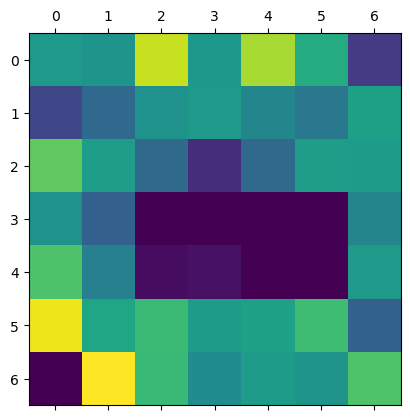

In [11]:
plt.matshow(heatmap.squeeze())
plt.show()

In [36]:
mask_list = list()
for class_index in tqdm(fp_index_arr):
      mask_list.append(np.array(gradcam(model_gradcam, img, class_index, device=device)))

100%|███████████████████████████████████████████████████████████████████████| 25/25 [00:01<00:00, 13.88it/s]


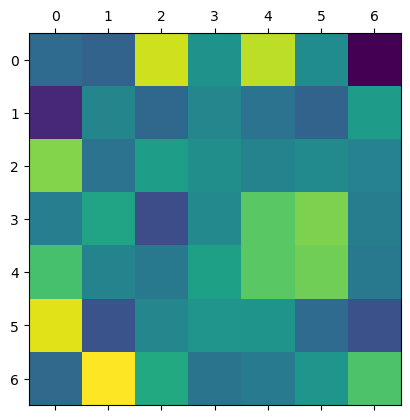

In [37]:
mask_list = np.array(mask_list)
mask_mean = mask_list.mean(axis=0)
mask_normalized = mask_mean/np.max(mask_mean)
plt.matshow(mask_normalized)
plt.show()

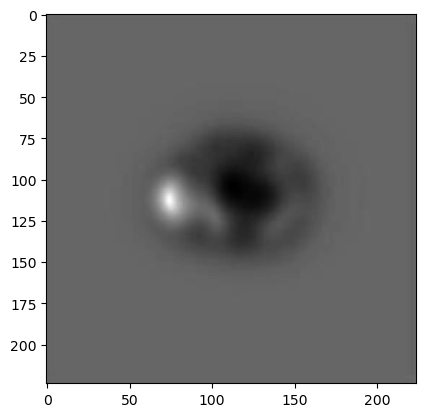

In [38]:
plt.imshow(img[0, 5, :, :], cmap='gray')
plt.show()

In [39]:
# Convert NumPy array to PIL Image
image_pil = Image.fromarray((mask_normalized * 255).astype(np.uint8))

# Resize PIL Image
new_size = (img.size(2), img.size(2))   # (width, height)
image_pil_resized = image_pil.resize(new_size)

# Convert PIL Image back to NumPy array
image_array_resized = np.array(image_pil_resized)

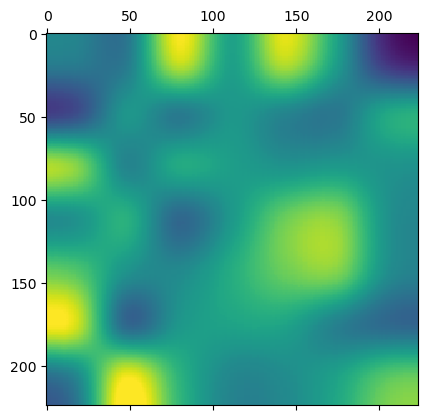

In [40]:
plt.matshow(image_array_resized)
plt.show()


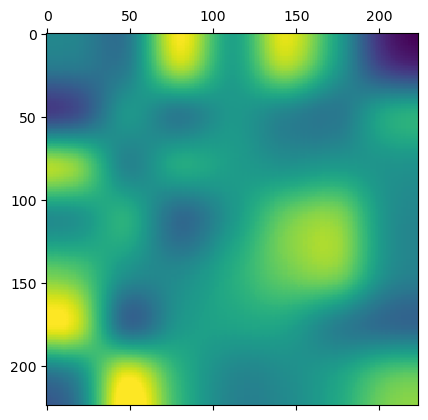

In [41]:
superimposed_img = image_array_resized * 0.1 + img[0, 5, :, :].cpu().numpy()
plt.matshow(superimposed_img)
plt.show()

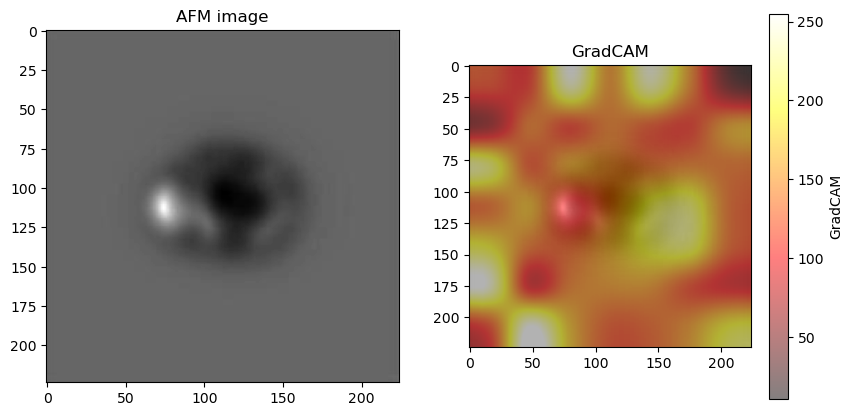

In [42]:
image = img[0, 5, :, :].cpu().numpy()
fig, ax = plt.subplots(1,2, figsize=(10, 5))
ax[0].imshow(image, cmap='gray')
ax[0].set_title('AFM image')

ax[1].imshow(image, cmap='gray')
grad_plot = ax[1].imshow(image_array_resized, cmap='hot', alpha=0.5)
ax[1].set_title('GradCAM')
cbar = fig.colorbar(grad_plot, ax=ax[1])
cbar.set_label('GradCAM')



## Group into pipeline

100%|███████████████████████████████████████████████████████████████████████| 25/25 [00:01<00:00, 14.09it/s]


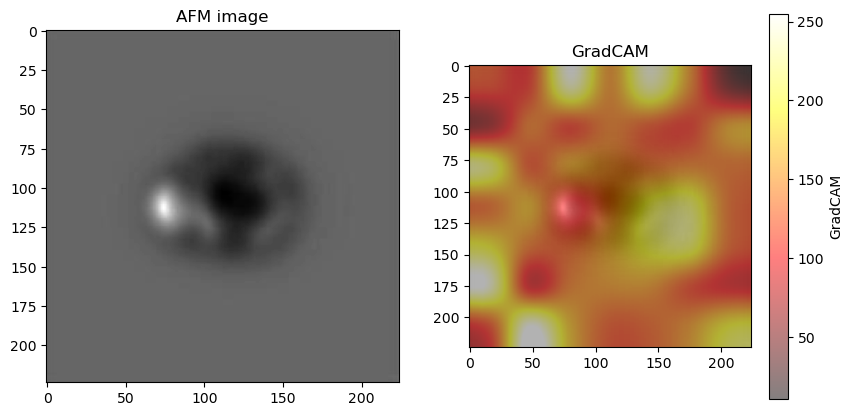

In [43]:
img, _ = next(iter(test_loader))
img = img[0:1]
# get the most likely prediction of the model
pred = model_gradcam(img.to(device))
fp_pred = (torch.sigmoid(pred) > 0.5).squeeze()

fp_index_arr = fp_pred.nonzero().detach().cpu().numpy().squeeze()

mask_list = list()
for class_index in tqdm(fp_index_arr):
      mask_list.append(np.array(gradcam(model_gradcam, img, class_index, device=device)))
        
mask_list = np.array(mask_list)
mask_mean = mask_list.mean(axis=0)
mask_normalized = mask_mean/np.max(mask_mean)

# Convert NumPy array to PIL Image
image_pil = Image.fromarray((mask_normalized * 255).astype(np.uint8))

# Resize PIL Image
new_size = (img.size(2), img.size(2))   # (width, height)
image_pil_resized = image_pil.resize(new_size)

# Convert PIL Image back to NumPy array
image_array_resized = np.array(image_pil_resized)

image = img[0, 5, :, :].cpu().numpy()
fig, ax = plt.subplots(1,2, figsize=(10, 5))
ax[0].imshow(image, cmap='gray')
ax[0].set_title('AFM image')

ax[1].imshow(image, cmap='gray')
grad_plot = ax[1].imshow(image_array_resized, cmap='hot', alpha=0.5)
ax[1].set_title('GradCAM')
cbar = fig.colorbar(grad_plot, ax=ax[1])
cbar.set_label('GradCAM')

100%|███████████████████████████████████████████| 23/23 [00:02<00:00,  9.78it/s]


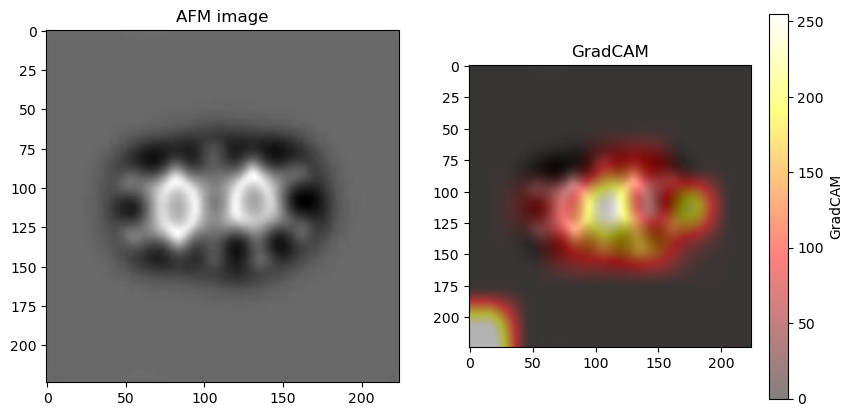

In [14]:
img, label = next(iter(test_loader))
IMG_INDEX = 19
img = img[IMG_INDEX:IMG_INDEX+1]
label = label[IMG_INDEX:IMG_INDEX+1]
# Additionally we can make the option of mapping to zero all values
# smaller than some threshold

THRESHOLD= 0.9

# get the most likely prediction of the model
pred = model_gradcam(img.to(device))
fp_pred = (torch.sigmoid(pred) > 0.5).squeeze()

pred_fp_index_arr = fp_pred.nonzero().detach().cpu().numpy().squeeze()

mask_list = list()
for class_index in tqdm(pred_fp_index_arr):
        mask = np.array(gradcam(model_gradcam, img, class_index, device=device))
    
        mask = (mask > THRESHOLD)*mask
        mask_list.append(mask)
        
mask_list = np.array(mask_list)
mask_mean = mask_list.mean(axis=0)
mask_normalized = mask_mean/np.max(mask_mean)


# Convert NumPy array to PIL Image
image_pil = Image.fromarray((mask_normalized * 255).astype(np.uint8))

# Resize PIL Image
new_size = (img.size(2), img.size(2))   # (width, height)
image_pil_resized = image_pil.resize(new_size)

# Convert PIL Image back to NumPy array
image_array_resized = np.array(image_pil_resized)

image = img[0, 5, :, :].cpu().numpy()
fig, ax = plt.subplots(1,2, figsize=(10, 5))
ax[0].imshow(image, cmap='gray')
ax[0].set_title('AFM image')

ax[1].imshow(image, cmap='gray')
grad_plot = ax[1].imshow(image_array_resized, cmap='hot', alpha=0.5)
ax[1].set_title('GradCAM')
cbar = fig.colorbar(grad_plot, ax=ax[1])
cbar.set_label('GradCAM')



Divide true positive, false positive and false negative fingerprints:
true positive: we predicted them and they are present in the molecule
false positive: we predicted them and they are not present
false negative: we didn't predict them and they are present

In [12]:
pred_fp_index_arr

array([202, 314, 325, 352, 356, 425, 449, 452, 463, 578, 583, 589, 636,
       650, 723, 787, 807, 816, 849, 851, 875, 901, 973])

In [15]:
gt_fp_index_arr = label.squeeze().nonzero().numpy().squeeze()
gt_fp_index_arr

array([202, 314, 325, 352, 356, 449, 452, 463, 578, 583, 589, 636, 650,
       723, 787, 807, 816, 849, 851, 875, 901, 973])

In [18]:
def conf_mat_fp(pred_fp_index_arr, gt_fp_index_arr):
    '''Given 2 sets of fingerprints, where one set is the prediction and the other 
    the ground truth, it outputs the true positives, false positives and false negatives 
    fingerprints defined as:
    true positive: we predicted them and they are present in the molecule.
    false positive: we predicted them and they are not present.
    false negative: we didn't predict them and they are present.
    
    INPUTS:
            pred_fp_index_arr: predicted fingerprints in sparse format (array of indexes)
            gt_fp_index_arr: ground truth fingerprints in sparse format
    
    '''
    
    
    true_pos = list()
    false_pos = list()
    false_neg = list()

    for index in pred_fp_index_arr:
        if index in gt_fp_index_arr:
            true_pos.append(index)
        else: 
            false_pos.append(index)

    for index in gt_fp_index_arr:
        if index not in pred_fp_index_arr:
            false_neg.append(index)

    true_pos  = np.array(true_pos )
    false_pos = np.array(false_pos)
    false_neg = np.array(false_neg)
    
    return true_pos, false_pos, false_neg

true_pos, false_pos, false_neg = conf_mat_fp(pred_fp_index_arr, gt_fp_index_arr)
print(true_pos )
print(false_pos)
print(false_neg)

[202 314 325 352 356 449 452 463 578 583 589 636 650 723 787 807 816 849
 851 875 901 973]
[425]
[]


100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  9.73it/s]


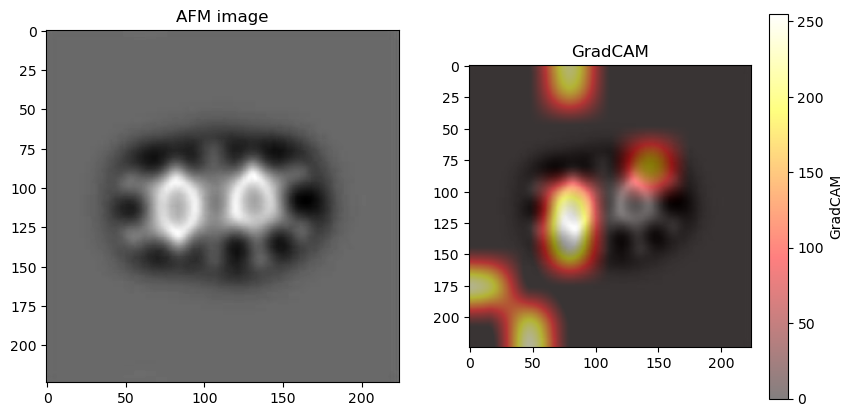

In [22]:
img, label = next(iter(test_loader))
IMG_INDEX = 19
img = img[IMG_INDEX:IMG_INDEX+1]
label = label[IMG_INDEX:IMG_INDEX+1]
# Additionally we can make the option of mapping to zero all values
# smaller than some threshold
gt_fp_index_arr = label.squeeze().nonzero().numpy().squeeze()

THRESHOLD= 0.7

# get the most likely prediction of the model
pred = model_gradcam(img.to(device))
fp_pred = (torch.sigmoid(pred) > 0.5).squeeze()

pred_fp_index_arr = fp_pred.nonzero().detach().cpu().numpy().squeeze()
true_pos, false_pos, false_neg = conf_mat_fp(pred_fp_index_arr, gt_fp_index_arr)

mask_list = list()
for class_index in tqdm(false_pos):
        mask = np.array(gradcam(model_gradcam, img, class_index, device=device))
    
        mask = (mask > THRESHOLD)*mask
        mask_list.append(mask)
        
mask_list = np.array(mask_list)
mask_mean = mask_list.mean(axis=0)
mask_normalized = mask_mean/np.max(mask_mean)


# Convert NumPy array to PIL Image
image_pil = Image.fromarray((mask_normalized * 255).astype(np.uint8))

# Resize PIL Image
new_size = (img.size(2), img.size(2))   # (width, height)
image_pil_resized = image_pil.resize(new_size)

# Convert PIL Image back to NumPy array
image_array_resized = np.array(image_pil_resized)

image = img[0, 5, :, :].cpu().numpy()
fig, ax = plt.subplots(1,2, figsize=(10, 5))
ax[0].imshow(image, cmap='gray')
ax[0].set_title('AFM image')

ax[1].imshow(image, cmap='gray')
grad_plot = ax[1].imshow(image_array_resized, cmap='hot', alpha=0.5)
ax[1].set_title('GradCAM')
cbar = fig.colorbar(grad_plot, ax=ax[1])
cbar.set_label('GradCAM')


### Load experimental images

In [9]:
def morgan_fp_gen(smiles, nBits=2048):
    m1 = AllChem.MolFromSmiles(smiles)
    fp1 = AllChem.GetMorganFingerprintAsBitVect(m1,2,nBits=nBits)
    return np.array(fp1)



def load_exp_img_stack(path, dimensions=[224,224], zoom=1):
    '''Obtains stack of experimental images from folder path and preprocess 
        it so we can directly feed it to our CNN

        INPUT: path of the folder containing the AFM images of the molecule

        OUTPUT: list of PIL images'''
    path_list = sorted(glob.glob(os.path.join(path,'*')))
    im_list = list()
    for im_path in path_list:
        
        im_list.append(Image.open(im_path).resize(dimensions, resample=Image.Resampling.BILINEAR).convert('L'))
        
    # Default parameters
        degrees = 0
        h_shift = 0
        v_shift = 0
        shear = 0

        
    for i in range(len(im_list)):
        im_list[i] = TF.affine(im_list[i], degrees, [h_shift, v_shift], zoom, shear,
                                interpolation=transforms.InterpolationMode.BILINEAR,
                                fill=im_list[i].getpixel((5, 5))
                                )

    to_tensor = transforms.ToTensor()

    tensor_stack = [to_tensor(im) for im in im_list.copy()]
    tensor_stack = torch.cat(tensor_stack)

    #normalize = transforms.Normalize(
    #    mean=[0.1321, 0.1487, 0.1689, 0.1983, 0.2229, 0.2591, 0.3430, 0.4580, 0.5787, 0.6887],
    #    std=[0.0853, 0.0853, 0.0883, 0.0942, 0.0969, 0.1066, 0.1419, 0.1840, 0.2144, 0.2215]) #this is for K-1



    normalize = transforms.Normalize(
        mean=[0.2855, 0.3973, 0.4424, 0.4134, 0.6759, 1.0664, 0.9904, 0.7708, 0.5748, 0.4055],
        std=[1.1341, 1.2528, 1.3125, 1.3561, 1.5844, 1.7763, 1.5447, 1.2683, 1.0588, 0.9308]) # for all K folders
    
    tensor_stack = normalize(tensor_stack)

    return tensor_stack

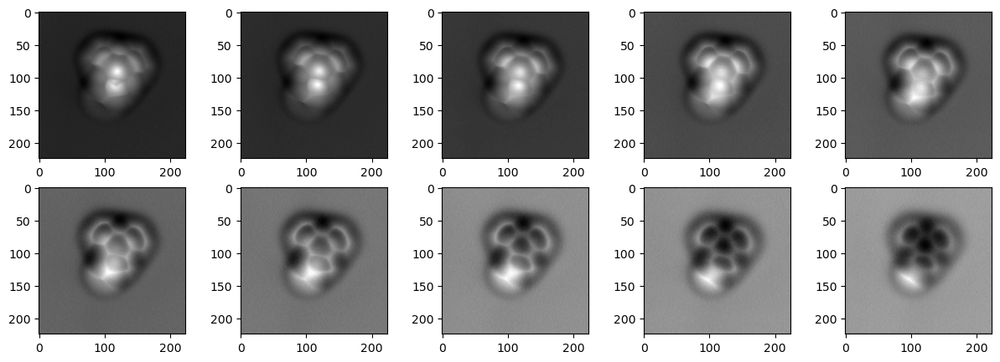

In [13]:
path = f'/home/{USER}/EXPERIMENTAL_IMAGES/RAW/2-Iodotriphenylene_88955426'
sorted(glob.glob(os.path.join(path,'*')))
exp_img = load_exp_img_stack(path, dimensions = [224,224], zoom=1)
#10 images
f, axarr = plt.subplots(2,5, figsize=(15, 5))
axarr[0,0].imshow(exp_img[0], cmap = 'gray')
axarr[0,1].imshow(exp_img[1], cmap = 'gray')
axarr[0,2].imshow(exp_img[2], cmap = 'gray')
axarr[0,3].imshow(exp_img[3], cmap = 'gray')
axarr[0,4].imshow(exp_img[4], cmap = 'gray')
axarr[1,0].imshow(exp_img[5], cmap = 'gray')
axarr[1,1].imshow(exp_img[6], cmap = 'gray')
axarr[1,2].imshow(exp_img[7], cmap = 'gray')
axarr[1,3].imshow(exp_img[8], cmap = 'gray')
axarr[1,4].imshow(exp_img[9], cmap = 'gray')

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 19/19 [00:01<00:00, 16.32it/s]


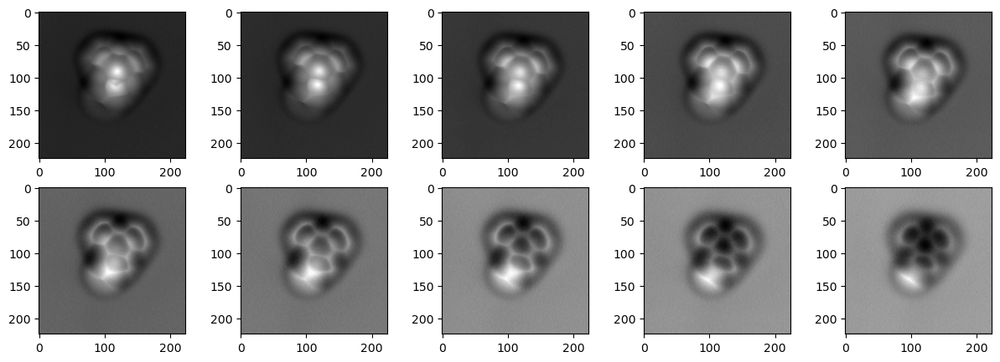

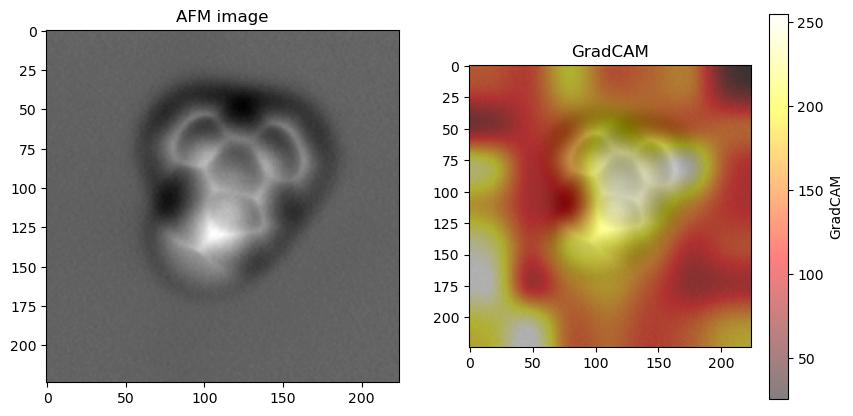

In [15]:
path = f'/home/{USER}/EXPERIMENTAL_IMAGES/RAW/2-Iodotriphenylene_88955426'
sorted(glob.glob(os.path.join(path,'*')))
exp_img = load_exp_img_stack(path, dimensions = [224,224], zoom=1)
#10 images
f, axarr = plt.subplots(2,5, figsize=(15, 5))
axarr[0,0].imshow(exp_img[0], cmap = 'gray')
axarr[0,1].imshow(exp_img[1], cmap = 'gray')
axarr[0,2].imshow(exp_img[2], cmap = 'gray')
axarr[0,3].imshow(exp_img[3], cmap = 'gray')
axarr[0,4].imshow(exp_img[4], cmap = 'gray')
axarr[1,0].imshow(exp_img[5], cmap = 'gray')
axarr[1,1].imshow(exp_img[6], cmap = 'gray')
axarr[1,2].imshow(exp_img[7], cmap = 'gray')
axarr[1,3].imshow(exp_img[8], cmap = 'gray')
axarr[1,4].imshow(exp_img[9], cmap = 'gray')
# Additionally we can make the option of mapping to zero all values
# smaller than some threshold


THRESHOLD= 0
img = exp_img.unsqueeze(0)
# get the most likely prediction of the model
pred = model_gradcam(img.to(device))
fp_pred = (torch.sigmoid(pred) > 0.5).squeeze()

fp_index_arr = fp_pred.nonzero().detach().cpu().numpy().squeeze()

mask_list = list()
for class_index in tqdm(fp_index_arr):
        mask = np.array(gradcam(model_gradcam, img, class_index, device=device))
    
        mask = (mask > THRESHOLD)*mask
        mask_list.append(mask)
        
mask_list = np.array(mask_list)
mask_mean = mask_list.mean(axis=0)
mask_normalized = mask_mean/np.max(mask_mean)


# Convert NumPy array to PIL Image
image_pil = Image.fromarray((mask_normalized * 255).astype(np.uint8))

# Resize PIL Image
new_size = (exp_img.size(2), exp_img.size(2))   # (width, height)
image_pil_resized = image_pil.resize(new_size)

# Convert PIL Image back to NumPy array
image_array_resized = np.array(image_pil_resized)

image = img[0, 5, :, :].cpu().numpy()
fig, ax = plt.subplots(1,2, figsize=(10, 5))
ax[0].imshow(image, cmap='gray')
ax[0].set_title('AFM image')

ax[1].imshow(image, cmap='gray')
grad_plot = ax[1].imshow(image_array_resized, cmap='hot', alpha=0.5)
ax[1].set_title('GradCAM')
cbar = fig.colorbar(grad_plot, ax=ax[1])
cbar.set_label('GradCAM')

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:01<00:00, 16.98it/s]


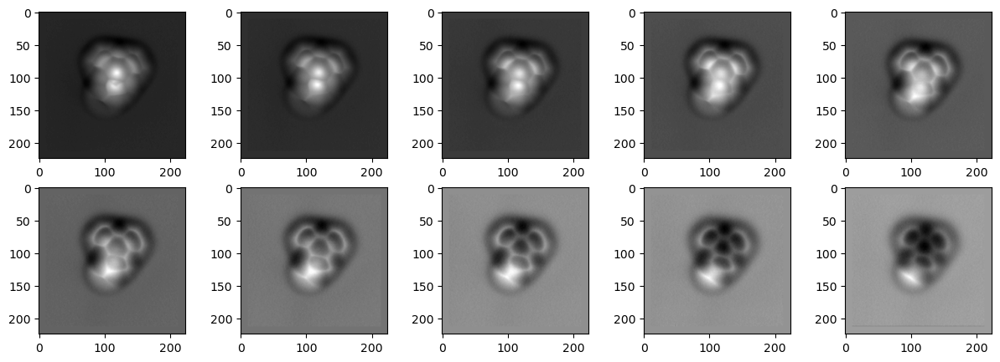

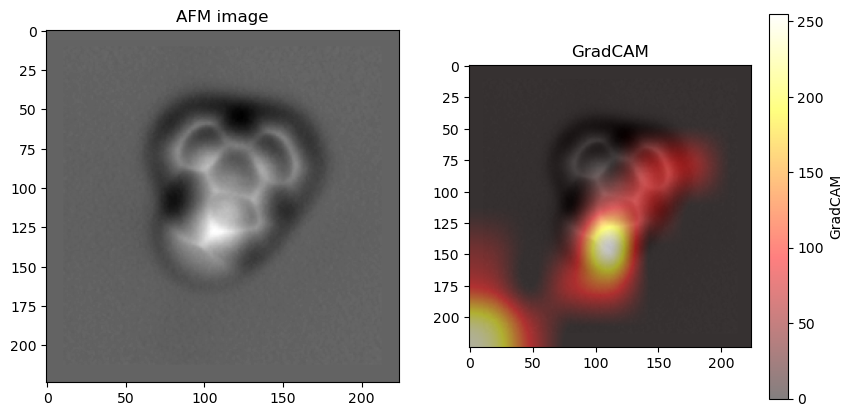

In [21]:
path = f'/home/{USER}/EXPERIMENTAL_IMAGES/RAW/2-Iodotriphenylene_88955426'
sorted(glob.glob(os.path.join(path,'*')))
exp_img = load_exp_img_stack(path, dimensions = [224,224], zoom=0.9)
#10 images
f, axarr = plt.subplots(2,5, figsize=(15, 5))
axarr[0,0].imshow(exp_img[0], cmap = 'gray')
axarr[0,1].imshow(exp_img[1], cmap = 'gray')
axarr[0,2].imshow(exp_img[2], cmap = 'gray')
axarr[0,3].imshow(exp_img[3], cmap = 'gray')
axarr[0,4].imshow(exp_img[4], cmap = 'gray')
axarr[1,0].imshow(exp_img[5], cmap = 'gray')
axarr[1,1].imshow(exp_img[6], cmap = 'gray')
axarr[1,2].imshow(exp_img[7], cmap = 'gray')
axarr[1,3].imshow(exp_img[8], cmap = 'gray')
axarr[1,4].imshow(exp_img[9], cmap = 'gray')
# Additionally we can make the option of mapping to zero all values
# smaller than some threshold


THRESHOLD= 0.9
img = exp_img.unsqueeze(0)
# get the most likely prediction of the model
pred = model_gradcam(img.to(device))
fp_pred = (torch.sigmoid(pred) > 0.5).squeeze()

fp_index_arr = fp_pred.nonzero().detach().cpu().numpy().squeeze()

mask_list = list()
for class_index in tqdm(fp_index_arr):
        mask = np.array(gradcam(model_gradcam, img, class_index, device=device))
    
        mask = (mask > THRESHOLD)*mask
        mask_list.append(mask)
        
mask_list = np.array(mask_list)
mask_mean = mask_list.mean(axis=0)
mask_normalized = mask_mean/np.max(mask_mean)


# Convert NumPy array to PIL Image
image_pil = Image.fromarray((mask_normalized * 255).astype(np.uint8))

# Resize PIL Image
new_size = (exp_img.size(2), exp_img.size(2))   # (width, height)
image_pil_resized = image_pil.resize(new_size)

# Convert PIL Image back to NumPy array
image_array_resized = np.array(image_pil_resized)

image = img[0, 5, :, :].cpu().numpy()
fig, ax = plt.subplots(1,2, figsize=(10, 5))
ax[0].imshow(image, cmap='gray')
ax[0].set_title('AFM image')

ax[1].imshow(image, cmap='gray')
grad_plot = ax[1].imshow(image_array_resized, cmap='hot', alpha=0.5)
ax[1].set_title('GradCAM')
cbar = fig.colorbar(grad_plot, ax=ax[1])
cbar.set_label('GradCAM')

100%|███████████████████████████████████████████| 32/32 [00:02<00:00, 11.65it/s]


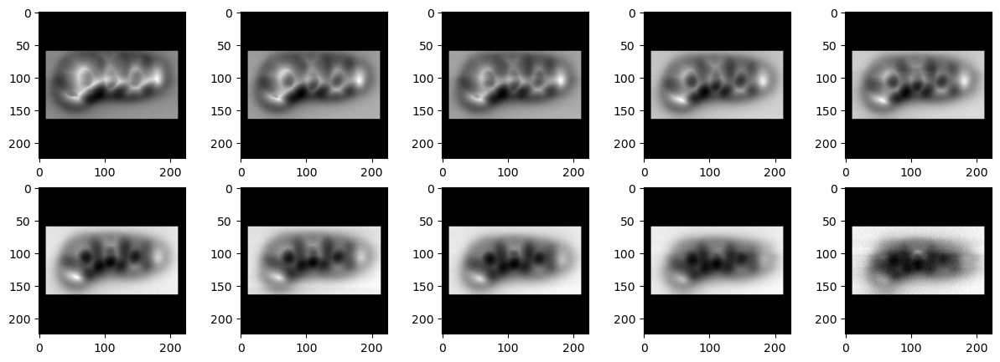

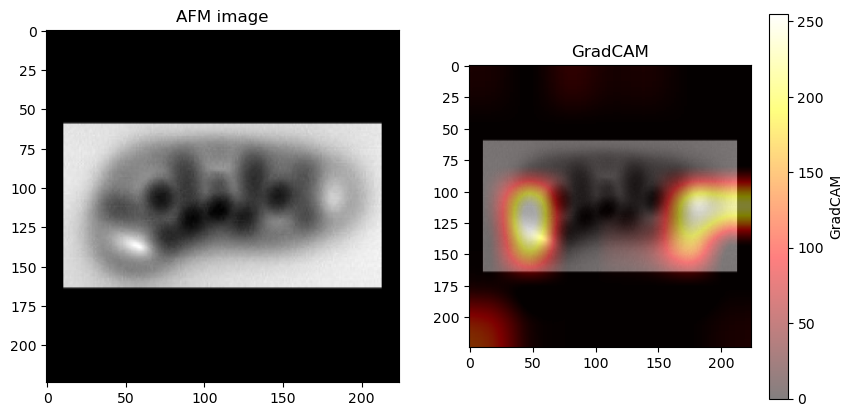

In [175]:
path = '/home/manuel/EXPERIMENTAL_IMAGES/EXTRAPOLATED/Iodo-para-Bromo-meta-terphenyl-Au111'
sorted(glob.glob(os.path.join(path,'*')))
exp_img = load_exp_img_stack(path, dimensions = [224,224], zoom=0.9)
#10 images
f, axarr = plt.subplots(2,5, figsize=(15, 5))
axarr[0,0].imshow(exp_img[0], cmap = 'gray')
axarr[0,1].imshow(exp_img[1], cmap = 'gray')
axarr[0,2].imshow(exp_img[2], cmap = 'gray')
axarr[0,3].imshow(exp_img[3], cmap = 'gray')
axarr[0,4].imshow(exp_img[4], cmap = 'gray')
axarr[1,0].imshow(exp_img[5], cmap = 'gray')
axarr[1,1].imshow(exp_img[6], cmap = 'gray')
axarr[1,2].imshow(exp_img[7], cmap = 'gray')
axarr[1,3].imshow(exp_img[8], cmap = 'gray')
axarr[1,4].imshow(exp_img[9], cmap = 'gray')
# Additionally we can make the option of mapping to zero all values
# smaller than some threshold


THRESHOLD= 0.9
img = exp_img.unsqueeze(0)
# get the most likely prediction of the model
pred = model_gradcam(img.to(device))
fp_pred = (torch.sigmoid(pred) > 0.5).squeeze()

fp_index_arr = fp_pred.nonzero().detach().cpu().numpy().squeeze()

mask_list = list()
for class_index in tqdm(fp_index_arr):
        mask = np.array(gradcam(model_gradcam, img, class_index, device=device))
    
        mask = (mask > THRESHOLD)*mask
        mask_list.append(mask)
        
mask_list = np.array(mask_list)
mask_mean = mask_list.mean(axis=0)
mask_normalized = mask_mean/np.max(mask_mean)


# Convert NumPy array to PIL Image
image_pil = Image.fromarray((mask_normalized * 255).astype(np.uint8))

# Resize PIL Image
new_size = (exp_img.size(2), exp_img.size(2))   # (width, height)
image_pil_resized = image_pil.resize(new_size)

# Convert PIL Image back to NumPy array
image_array_resized = np.array(image_pil_resized)

image = img[0, 5, :, :].cpu().numpy()
fig, ax = plt.subplots(1,2, figsize=(10, 5))
ax[0].imshow(image, cmap='gray')
ax[0].set_title('AFM image')

ax[1].imshow(image, cmap='gray')
grad_plot = ax[1].imshow(image_array_resized, cmap='hot', alpha=0.5)
ax[1].set_title('GradCAM')
cbar = fig.colorbar(grad_plot, ax=ax[1])
cbar.set_label('GradCAM')

Dividing true positives, false positives and false negatives

[356 849 875]
[202 314 325 352 425 449 452 463 578 583 589 636 650 723 787 807 816 851
 901 973]
[ 15  64 136 266 470 485 503 570 607 661 726 728 736 766 785 896 909 940
 947]


100%|███████████████████████████████████████████| 32/32 [00:03<00:00,  9.20it/s]


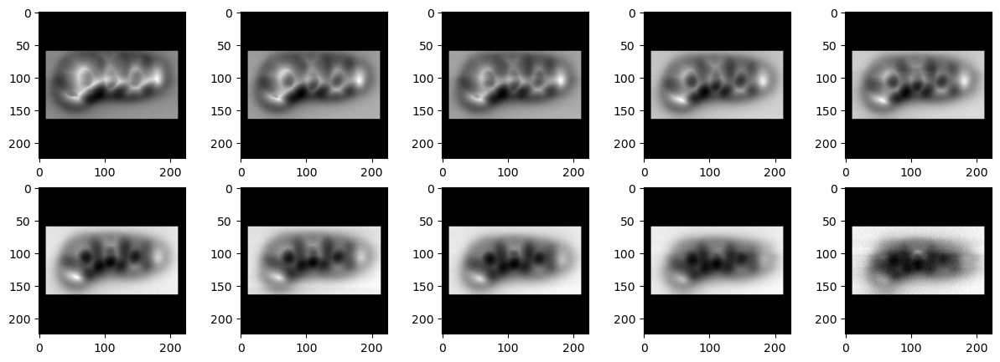

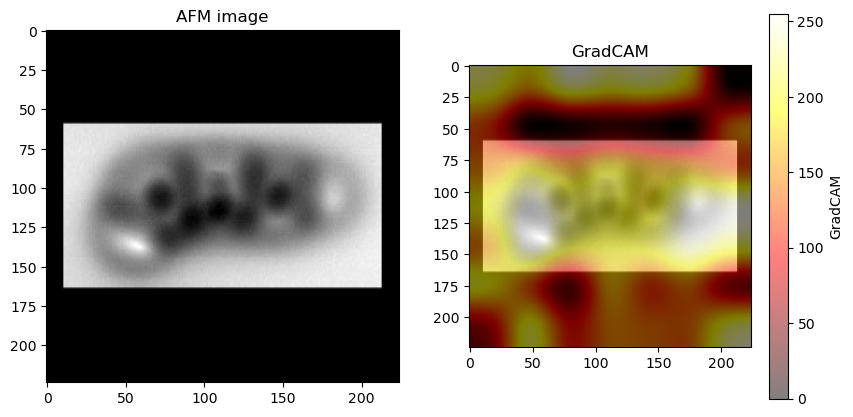

In [47]:
path = '/home/manuel/EXPERIMENTAL_IMAGES/EXTRAPOLATED/Iodo-para-Bromo-meta-terphenyl-Au111'
sorted(glob.glob(os.path.join(path,'*')))
exp_img = load_exp_img_stack(path, dimensions = [224,224], zoom=0.9)

SMILES = 'IC=1(C=CC(=CC=1)C=2(C=CC(=CC=2)C=3(C=CC=C(C=3)Br)))'
morgan_fp = morgan_fp_gen(SMILES, nBits=1024)
gt_fp_index_arr = morgan_fp.nonzero()[0]


#10 images
f, axarr = plt.subplots(2,5, figsize=(15, 5))
axarr[0,0].imshow(exp_img[0], cmap = 'gray')
axarr[0,1].imshow(exp_img[1], cmap = 'gray')
axarr[0,2].imshow(exp_img[2], cmap = 'gray')
axarr[0,3].imshow(exp_img[3], cmap = 'gray')
axarr[0,4].imshow(exp_img[4], cmap = 'gray')
axarr[1,0].imshow(exp_img[5], cmap = 'gray')
axarr[1,1].imshow(exp_img[6], cmap = 'gray')
axarr[1,2].imshow(exp_img[7], cmap = 'gray')
axarr[1,3].imshow(exp_img[8], cmap = 'gray')
axarr[1,4].imshow(exp_img[9], cmap = 'gray')


# Additionally we can make the option of mapping to zero all values
# smaller than some threshold
THRESHOLD= 0.4
img = exp_img.unsqueeze(0)
# get the most likely prediction of the model
pred = model_gradcam(img.to(device))
fp_pred = (torch.sigmoid(pred) > 0.5).squeeze()


# Compute true positives, false positives and false negatives 
fp_index_arr = fp_pred.nonzero().detach().cpu().numpy().squeeze()

true_pos, false_pos, false_neg = conf_mat_fp(pred_fp_index_arr, gt_fp_index_arr)
print(true_pos)
print(false_pos)
print(false_neg)

mask_list = list()
for class_index in tqdm(fp_index_arr):
        mask = np.array(gradcam(model_gradcam, img, class_index, device=device))
    
        mask = (mask > THRESHOLD)*mask
        mask_list.append(mask)
        
mask_list = np.array(mask_list)
mask_mean = mask_list.mean(axis=0)
mask_normalized = mask_mean/np.max(mask_mean)


# Convert NumPy array to PIL Image
image_pil = Image.fromarray((mask_normalized * 255).astype(np.uint8))

# Resize PIL Image
new_size = (exp_img.size(2), exp_img.size(2))   # (width, height)
image_pil_resized = image_pil.resize(new_size)

# Convert PIL Image back to NumPy array
image_array_resized = np.array(image_pil_resized)

image = img[0, 5, :, :].cpu().numpy()
fig, ax = plt.subplots(1,2, figsize=(10, 5))
ax[0].imshow(image, cmap='gray')
ax[0].set_title('AFM image')

ax[1].imshow(image, cmap='gray')
grad_plot = ax[1].imshow(image_array_resized, cmap='hot', alpha=0.5)
ax[1].set_title('GradCAM')
cbar = fig.colorbar(grad_plot, ax=ax[1])
cbar.set_label('GradCAM')

In [37]:

gt_fp_index_arr




array([ 15,  64, 136, 266, 356, 470, 485, 503, 570, 607, 661, 726, 728,
       736, 766, 785, 849, 875, 896, 909, 940, 947])

## Other stuff

In [28]:
# let's try it out

MOLECULE_INDEX = 34 #34 is a good example of not being perfect but good enough
molec_path = test_df.iloc[MOLECULE_INDEX]['path']
true_CID = test_df.iloc[MOLECULE_INDEX]['CID']
print(molec_path)
print(true_CID)
query = test_df.iloc[MOLECULE_INDEX]['morgan_fp'] 

true_output_df = fp_screening_function(query, test_df)
true_output_df

/scratch/manuel/QUAM/K-1/Conformer3D_CID_129672956_K040_Amp040
129672956


,path,CID,SMILES,morgan_fp,split,tanimoto
163325,/scratch/manuel/QUAM/K-1/Conformer3D_CID_12967...,129672956,C1=CC2=C(C=CS2)C3=CC4=COC=C4C=C31,"[0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, ...",test,1.00000
2021,/scratch/manuel/QUAM/K-1/Conformer3D_CID_12989...,129892136,C1=CC2=C(C=CC3=C2C=CS3)C4=C1C5=C(C=C4)SC=C5,"[0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, ...",test,0.50000
214195,/scratch/manuel/QUAM/K-1/Conformer3D_CID_5889_...,5889,C1=CC=C2C(=C1)C=CC3=CC4=C(C=CC5=CC=CC=C54)C=C32,"[0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, ...",test,0.48000
219474,/scratch/manuel/QUAM/K-1/Conformer3D_CID_67471...,67471,C1=CC=C2C(=C1)C=CC3=CC4=CC5=C(C=C6C=CC7=CC=CC=...,"[0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, ...",test,0.48000
178366,/scratch/manuel/QUAM/K-1/Conformer3D_CID_12977...,129773596,C1=CC=C2C(=C1)C=CC3=C2C=CC4=C3C=CC5=C4C6=C(C=C...,"[0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, ...",test,0.46875
...,...,...,...,...,...,...
574284,/scratch/manuel/QUAM/K-1/Conformer3D_CID_12342...,12342,C(=O)NNC=O,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",test,0.00000
202696,/scratch/manuel/QUAM/K-1/Conformer3D_CID_27271...,272714,COC(=O)C(=O)N,"[0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",test,0.00000
545398,/scratch/manuel/QUAM/K-1/Conformer3D_CID_54096...,54096262,C(#N)N(C#N)C(=O)N,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",test,0.00000
195811,/scratch/manuel/QUAM/K-1/Conformer3D_CID_17303...,173032,C(=C(O)O)O,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, ...",test,0.00000


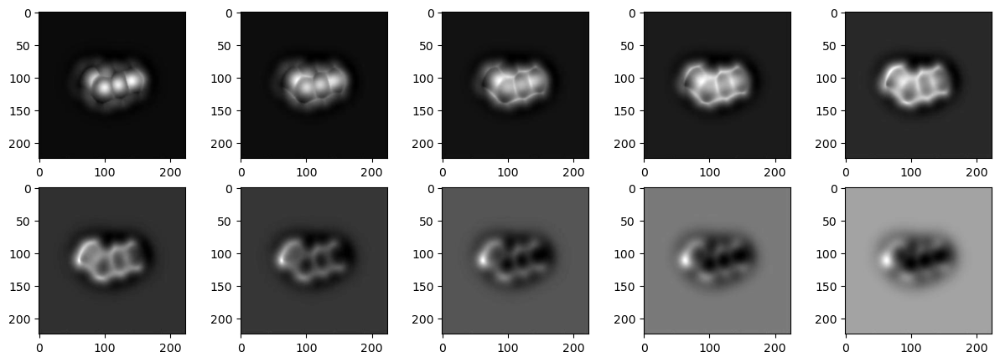

In [29]:
img_stack = load_img_stack(molec_path)
f, axarr = plt.subplots(2,5, figsize=(15, 5))
axarr[0,0].imshow(img_stack[0], cmap = 'gray')
axarr[0,1].imshow(img_stack[1], cmap = 'gray')
axarr[0,2].imshow(img_stack[2], cmap = 'gray')
axarr[0,3].imshow(img_stack[3], cmap = 'gray')
axarr[0,4].imshow(img_stack[4], cmap = 'gray')
axarr[1,0].imshow(img_stack[5], cmap = 'gray')
axarr[1,1].imshow(img_stack[6], cmap = 'gray')
axarr[1,2].imshow(img_stack[7], cmap = 'gray')
axarr[1,3].imshow(img_stack[8], cmap = 'gray')
axarr[1,4].imshow(img_stack[9], cmap = 'gray')

Now with fingerprints that come from our model.

In [31]:
fp_pred = predict_fp(model, molec_path, device,  thres = 0.5)
print('Total number of fingerprints', np.sum(fp_pred))
output_df = fp_screening_function(fp_pred, test_df, top_k = 5)

print('Is the correct CID in the top k candidates?',  true_CID in list(output_df['CID']))
output_df

Total number of fingerprints 23
Is the correct CID in the top k candidates? True


,path,CID,SMILES,morgan_fp,split,tanimoto
163325,/scratch/manuel/QUAM/K-1/Conformer3D_CID_12967...,129672956,C1=CC2=C(C=CS2)C3=CC4=COC=C4C=C31,"[0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, ...",test,0.956522
2021,/scratch/manuel/QUAM/K-1/Conformer3D_CID_12989...,129892136,C1=CC2=C(C=CC3=C2C=CS3)C4=C1C5=C(C=C4)SC=C5,"[0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, ...",test,0.480000
112603,/scratch/manuel/QUAM/K-1/Conformer3D_CID_12978...,129782164,C1=CC2=NC=NC=C2C3=C1C=NN3,"[0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, ...",test,0.468750
219474,/scratch/manuel/QUAM/K-1/Conformer3D_CID_67471...,67471,C1=CC=C2C(=C1)C=CC3=CC4=CC5=C(C=C6C=CC7=CC=CC=...,"[0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, ...",test,0.461538
214195,/scratch/manuel/QUAM/K-1/Conformer3D_CID_5889_...,5889,C1=CC=C2C(=C1)C=CC3=CC4=C(C=CC5=CC=CC=C54)C=C32,"[0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, ...",test,0.461538


### Visualizing predictions: 
Using gradcam we check where is the cnn looking in order to make the predictions

In [40]:
model

EfficientNet(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(10, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): SiLU(inplace=True)
    )
    (1): Sequential(
      (0): MBConv(
        (block): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
            (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (2): SiLU(inplace=True)
          )
          (1): SqueezeExcitation(
            (avgpool): AdaptiveAvgPool2d(output_size=1)
            (fc1): Conv2d(32, 8, kernel_size=(1, 1), stride=(1, 1))
            (fc2): Conv2d(8, 32, kernel_size=(1, 1), stride=(1, 1))
            (activation): SiLU(inplace=True)
            (scale_activation): Sigmoid()
          )
          (2): Conv2dNormActiva

In [37]:
model.features

Sequential(
  (0): Conv2dNormActivation(
    (0): Conv2d(10, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): SiLU(inplace=True)
  )
  (1): Sequential(
    (0): MBConv(
      (block): Sequential(
        (0): Conv2dNormActivation(
          (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
          (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (2): SiLU(inplace=True)
        )
        (1): SqueezeExcitation(
          (avgpool): AdaptiveAvgPool2d(output_size=1)
          (fc1): Conv2d(32, 8, kernel_size=(1, 1), stride=(1, 1))
          (fc2): Conv2d(8, 32, kernel_size=(1, 1), stride=(1, 1))
          (activation): SiLU(inplace=True)
          (scale_activation): Sigmoid()
        )
        (2): Conv2dNormActivation(
          (0): Conv2d(32, 16, kernel_size=(1, 1), stride=(1, 1),

In [55]:
class Dissect_Eff_net(nn.Module):
    def __init__(self, model):
        super(Dissect_Eff_net, self).__init__()
        
        # get the trained eff_net 
        self.eff_net = model
        
        # disect the network to access its last convolutional layer
        self.features_conv = model.features
        
        # get the max pool of the features stem
        self.avg_pool = model.avgpool
        
        # get the classifier of the vgg19
        self.classifier = model.classifier
        
        # placeholder for the gradients
        self.gradients = None
    
    # hook for the gradients of the activations
    def activations_hook(self, grad):
        self.gradients = grad
        
    def forward(self, x):
        x = self.features_conv(x)
        # register the hook
        h = x.register_hook(self.activations_hook)
        
        # apply the remaining pooling
        x = self.avg_pool(x)
        x = x.view((1, -1))
        x = self.classifier(x)
        return x
    
    # method for the gradient extraction
    def get_activations_gradient(self):
        return self.gradients
    
    # method for the activation exctraction
    def get_activations(self, x):
        return self.features_conv(x)

In [56]:
ones = torch.ones([1, 10, 224, 224]).to(device)

In [57]:
dissect_model = Dissect_Eff_net(model)
dissect_model(ones)

tensor([[ -3.1258,  -3.7886,  -3.6439,  -1.8354,  -2.8556,  -5.5518,  -2.8350,
          -2.9695, -13.7620,  -4.0095,  -2.4987,  -2.2114,  -5.4700,  -2.0788,
          -3.5716,  -5.0206,  -2.3666,  -3.0364,  -2.6087,  -3.2519,  -2.4945,
          -3.4573,  -2.0348,  -3.6692,  -2.2444,  -3.7335,  -2.7950,  -3.5795,
          -4.0438,  -3.8050,  -4.6669,  -3.2474,  -2.5877,  -3.8012,  -4.6246,
          -3.7115,  -2.2384,  -2.2782,  -2.2788,  -4.5982,  -3.5062,  -3.2188,
          -3.6525,  -3.6050,  -3.5230,  -3.1362,  -2.8886,  -1.9970,  -2.3097,
          -5.2609,  -2.5605,  -2.2525,  -2.9447,  -3.3884,  -1.1383,  -2.8746,
          -3.4353,  -3.1346,  -6.9004,  -4.4237,  -2.3574,  -2.0731,  -3.2597,
          -1.7758,  -1.3106,  -3.4298,  -3.6852,  -3.2351,  -3.8714,  -5.0861,
          -3.5494,  -7.1229,  -4.2033,  -2.9904,  -2.8990,  -3.0344,  -2.5977,
          -4.2538,  -2.4824,  -2.0164,  -4.8607,  -2.6948,  -1.2170,  -3.6279,
          -6.2653,  -2.0650,  -2.0685,  -3.0416,  -3

In [72]:
#try with experimental image
input_stack = img_stack.to(device).unsqueeze(dim = 0)
pred = dissect_model(input_stack).detach()
pred[0,8]

tensor(37.1604, device='cuda:0')

In [73]:
pred[0,8].backward()
gradients = dissect_model.get_activations_gradient()

# pool the gradients across the channels
pooled_gradients = torch.mean(gradients, dim=[0, 2, 3])

# get the activations of the last convolutional layer
activations = dissect_model.get_activations(input_stack).detach()

# weight the channels by corresponding gradients
for i in range(1280):
    activations[:, i, :, :] *= pooled_gradients[i]
    
# average the channels of the activations
heatmap = torch.mean(activations, dim=1).squeeze()

# relu on top of the heatmap
# expression (2) in https://arxiv.org/pdf/1610.02391.pdf
heatmap = np.maximum(heatmap, 0)

# normalize the heatmap
heatmap /= torch.max(heatmap)

# draw the heatmap
plt.matshow(heatmap.squeeze())

RuntimeError: element 0 of tensors does not require grad and does not have a grad_fn

In [75]:
!pip install grad-cam


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 2.6 MB/s eta 0:00:0000:0100:01m
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.8/61.8 MB 1.1 MB/s eta 0:00:00:00:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.6/9.6 MB 5.5 MB/s eta 0:00:00:00:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 298.0/298.0 kB 3.9 MB/s eta 0:00:0000:01
  Created wheel for grad-cam: filename=grad_cam-1.4.6-py3-none-any.whl size=38242 sha256=d91d0de248039fdee84264753d10aca7006e136dd4d71484652e25ddce024c99
  Stored in directory: /home/manuel/.cache/pip/wheels/3c/6c/04/9a543775e9f25f6c441180a552456f1696167439459730ff87
Successfully built grad-cam


In [77]:



from pytorch_grad_cam import GradCAM, HiResCAM, ScoreCAM, GradCAMPlusPlus, AblationCAM, XGradCAM, EigenCAM, FullGrad
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image


SiLU(inplace=True)

In [111]:

target_layers = [model.features[8][2]]


# Construct the CAM object once, and then re-use it on many images:
cam = GradCAM(model=model, target_layers=target_layers, use_cuda=True)

# We have to specify the target we want to generate
# the Class Activation Maps for.
# If targets is None, the highest scoring category
# will be used for every image in the batch.
# Here we use ClassifierOutputTarget, but you can define your own custom targets
# That are, for example, combinations of categories, or specific outputs in a non standard model.

targets = [ClassifierOutputTarget(8)]

# You can also pass aug_smooth=True and eigen_smooth=True, to apply smoothing.
grayscale_cam = cam(input_tensor=input_stack, targets=targets)

# In this example grayscale_cam has only one image in the batch:
grayscale_cam = grayscale_cam[0, :]
visualization = show_cam_on_image(img_stack_norm[3:6], grayscale_cam, use_rgb=True)




TypeError: max() received an invalid combination of arguments - got (out=NoneType, axis=NoneType, ), but expected one of:
 * ()
 * (Tensor other)
 * (int dim, bool keepdim)
      didn't match because some of the keywords were incorrect: out, axis
 * (name dim, bool keepdim)
      didn't match because some of the keywords were incorrect: out, axis


In [115]:

target_layers = [model.features]
with GradCAM(model=model, target_layers=target_layers) as cam:
    grayscale_cams = cam(input_tensor=input_stack, targets=targets)
    cam_image = show_cam_on_image(img_stack_norm[3:6], grayscale_cams[0, :], use_rgb=True)
cam = np.uint8(255*grayscale_cams[0, :])
cam = cv2.merge([cam, cam, cam])
images = np.hstack((np.uint8(255*img_stack_norm[3:6]), cam , cam_image))
Image.fromarray(images)

TypeError: max() received an invalid combination of arguments - got (out=NoneType, axis=NoneType, ), but expected one of:
 * ()
 * (Tensor other)
 * (int dim, bool keepdim)
      didn't match because some of the keywords were incorrect: out, axis
 * (name dim, bool keepdim)
      didn't match because some of the keywords were incorrect: out, axis


In [93]:
img_stack[3:5].size()

torch.Size([2, 224, 224])

In [110]:
img_stack_norm = (img_stack - img_stack.min())/(img_stack.max() - img_stack.min()).cpu().numpy()

In [109]:
img_stack_norm.min()

tensor(0.)

Another try

### Final figure: heatmap for experimental molecules

In [10]:
def compute_gradcam_figure(path, zoom, threshold, verbose=True):
    exp_img = load_exp_img_stack(path, dimensions = [224,224], zoom=zoom)
    img = exp_img.unsqueeze(0)
    # get the most likely prediction of the model
    pred = model_gradcam(img.to(device))
    fp_pred = (torch.sigmoid(pred) > 0.5).squeeze()

    fp_index_arr = fp_pred.nonzero().detach().cpu().numpy().squeeze()

    mask_list = list()
    if verbose:
        for class_index in tqdm(fp_index_arr):
                mask = np.array(gradcam(model_gradcam, img, class_index, device=device))

                mask = (mask > threshold)*mask
                mask_list.append(mask)
    else:
        for class_index in fp_index_arr:
                mask = np.array(gradcam(model_gradcam, img, class_index, device=device))

                mask = (mask > threshold)*mask
                mask_list.append(mask)

    mask_list = np.array(mask_list)
    mask_mean = mask_list.mean(axis=0)
    mask_normalized = mask_mean/np.max(mask_mean)


    # Convert NumPy array to PIL Image
    image_pil = Image.fromarray((mask_normalized * 255).astype(np.uint8))

    # Resize PIL Image
    new_size = (exp_img.size(2), exp_img.size(2))   # (width, height)
    image_pil_resized = image_pil.resize(new_size)

    # Convert PIL Image back to NumPy array
    image_array_resized = np.array(image_pil_resized)
    
    return exp_img, image_array_resized

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 19/19 [00:01<00:00, 16.32it/s]


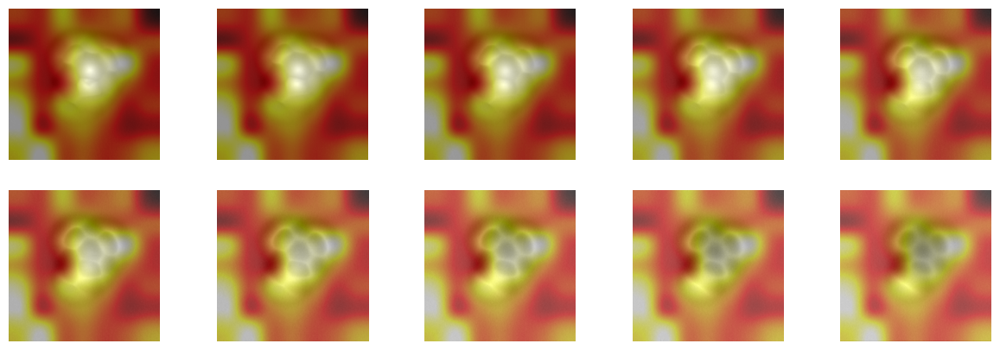

In [16]:
THRESHOLD= 0.0
alpha = 0.5
ZOOM = 1.0

path = f'/home/{USER}/EXPERIMENTAL_IMAGES/RAW/2-Iodotriphenylene_88955426'
sorted(glob.glob(os.path.join(path,'*')))
exp_img = load_exp_img_stack(path, dimensions = [224,224], zoom=ZOOM)
#10 images
f, axarr = plt.subplots(2,5, figsize=(15, 5))
axarr[0,0].imshow(exp_img[0], cmap = 'gray')
axarr[0,1].imshow(exp_img[1], cmap = 'gray')
axarr[0,2].imshow(exp_img[2], cmap = 'gray')
axarr[0,3].imshow(exp_img[3], cmap = 'gray')
axarr[0,4].imshow(exp_img[4], cmap = 'gray')
axarr[1,0].imshow(exp_img[5], cmap = 'gray')
axarr[1,1].imshow(exp_img[6], cmap = 'gray')
axarr[1,2].imshow(exp_img[7], cmap = 'gray')
axarr[1,3].imshow(exp_img[8], cmap = 'gray')
axarr[1,4].imshow(exp_img[9], cmap = 'gray')
# Additionally we can make the option of mapping to zero all values
# smaller than some threshold



img = exp_img.unsqueeze(0)
# get the most likely prediction of the model
pred = model_gradcam(img.to(device))
fp_pred = (torch.sigmoid(pred) > 0.5).squeeze()

fp_index_arr = fp_pred.nonzero().detach().cpu().numpy().squeeze()

mask_list = list()
for class_index in tqdm(fp_index_arr):
        mask = np.array(gradcam(model_gradcam, img, class_index, device=device))
    
        mask = (mask > THRESHOLD)*mask
        mask_list.append(mask)
        
mask_list = np.array(mask_list)
mask_mean = mask_list.mean(axis=0)
mask_normalized = mask_mean/np.max(mask_mean)


# Convert NumPy array to PIL Image
image_pil = Image.fromarray((mask_normalized * 255).astype(np.uint8))

# Resize PIL Image
new_size = (exp_img.size(2), exp_img.size(2))   # (width, height)
image_pil_resized = image_pil.resize(new_size)

# Convert PIL Image back to NumPy array
image_array_resized = np.array(image_pil_resized)



for i in range(2):
    for j in range(5):
        axarr[i,j].axis('off')
        axarr[i,j].imshow(image_array_resized, cmap='hot', alpha=alpha)

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 19/19 [00:01<00:00, 16.37it/s]


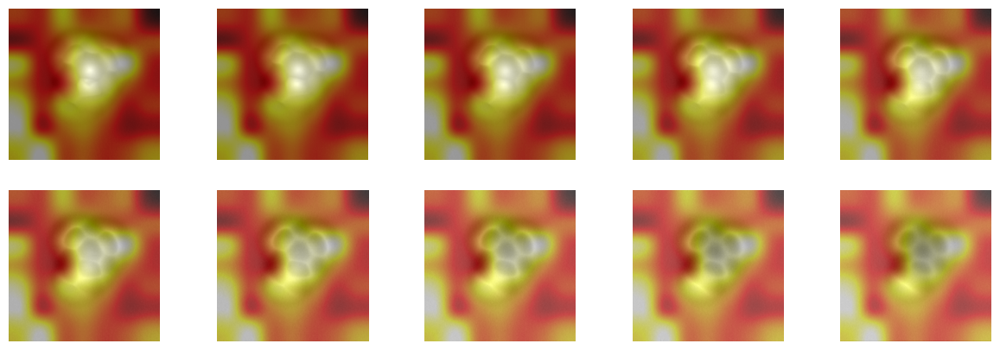

In [25]:
THRESHOLD = 0.0
ALPHA = 0.5
ZOOM = 1.0

path = f'/home/{USER}/EXPERIMENTAL_IMAGES/RAW/2-Iodotriphenylene_88955426'

exp_img, heatmap = compute_gradcam_figure(path, zoom = ZOOM, threshold = THRESHOLD)

#10 images
f, axarr = plt.subplots(2,5, figsize=(15, 5))
axarr[0,0].imshow(exp_img[0], cmap = 'gray')
axarr[0,1].imshow(exp_img[1], cmap = 'gray')
axarr[0,2].imshow(exp_img[2], cmap = 'gray')
axarr[0,3].imshow(exp_img[3], cmap = 'gray')
axarr[0,4].imshow(exp_img[4], cmap = 'gray')
axarr[1,0].imshow(exp_img[5], cmap = 'gray')
axarr[1,1].imshow(exp_img[6], cmap = 'gray')
axarr[1,2].imshow(exp_img[7], cmap = 'gray')
axarr[1,3].imshow(exp_img[8], cmap = 'gray')
axarr[1,4].imshow(exp_img[9], cmap = 'gray')


for i in range(2):
    for j in range(5):
        axarr[i,j].axis('off')
        axarr[i,j].imshow(heatmap, cmap='hot', alpha=ALPHA)

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:01<00:00, 16.33it/s]


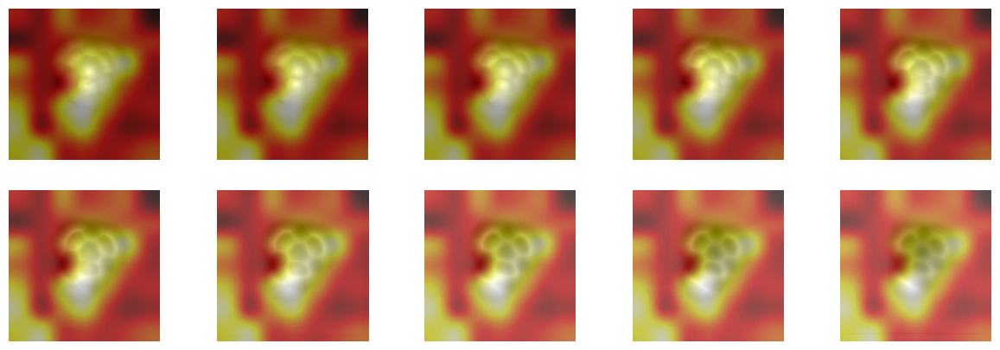

In [26]:
THRESHOLD = 0.0
ALPHA = 0.5
ZOOM = 0.9

path = f'/home/{USER}/EXPERIMENTAL_IMAGES/RAW/2-Iodotriphenylene_88955426'

exp_img, heatmap = compute_gradcam_figure(path, zoom = ZOOM, threshold = THRESHOLD)

#10 images
f, axarr = plt.subplots(2,5, figsize=(15, 5))
axarr[0,0].imshow(exp_img[0], cmap = 'gray')
axarr[0,1].imshow(exp_img[1], cmap = 'gray')
axarr[0,2].imshow(exp_img[2], cmap = 'gray')
axarr[0,3].imshow(exp_img[3], cmap = 'gray')
axarr[0,4].imshow(exp_img[4], cmap = 'gray')
axarr[1,0].imshow(exp_img[5], cmap = 'gray')
axarr[1,1].imshow(exp_img[6], cmap = 'gray')
axarr[1,2].imshow(exp_img[7], cmap = 'gray')
axarr[1,3].imshow(exp_img[8], cmap = 'gray')
axarr[1,4].imshow(exp_img[9], cmap = 'gray')


for i in range(2):
    for j in range(5):
        axarr[i,j].axis('off')
        axarr[i,j].imshow(heatmap, cmap='hot', alpha=ALPHA)

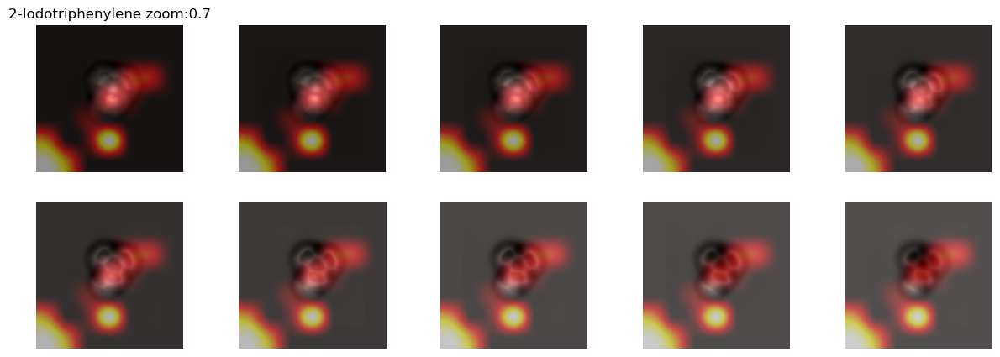

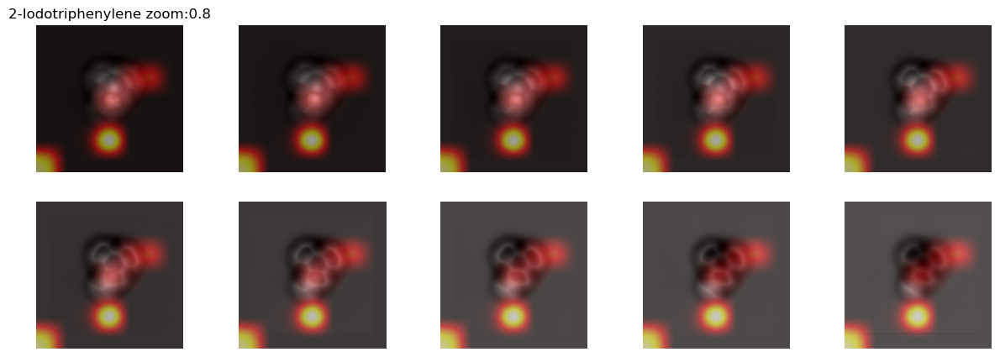

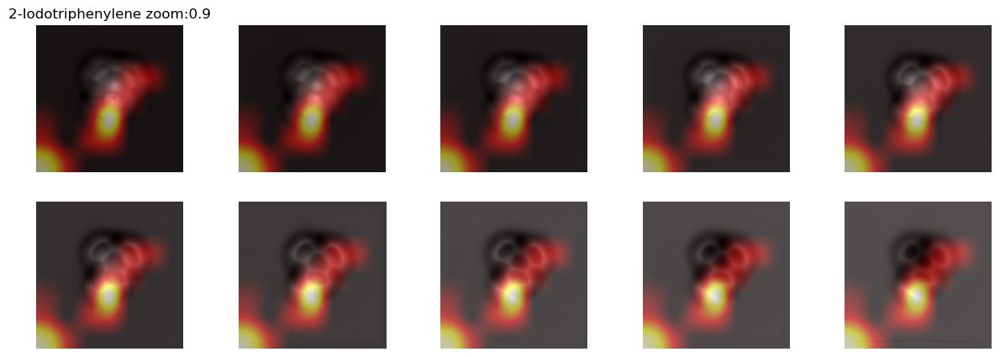

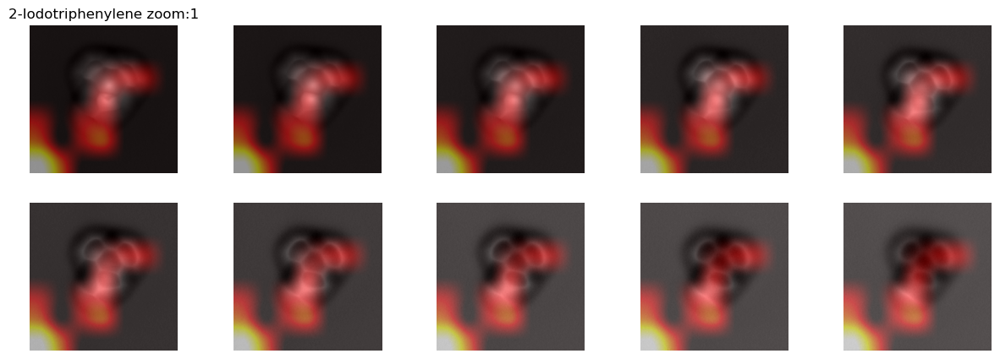

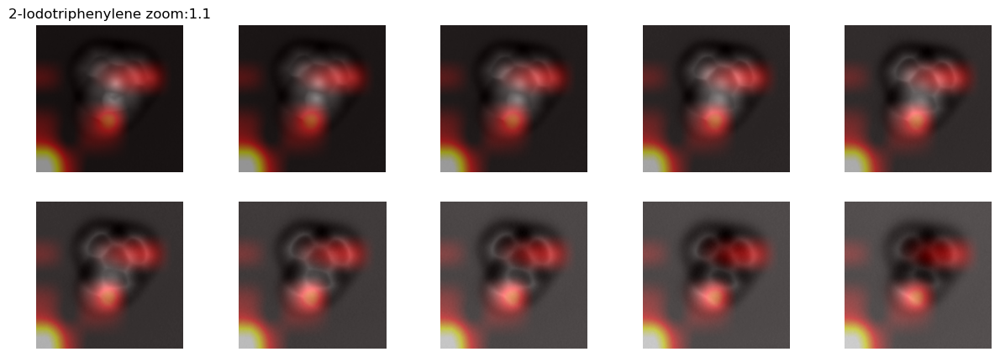

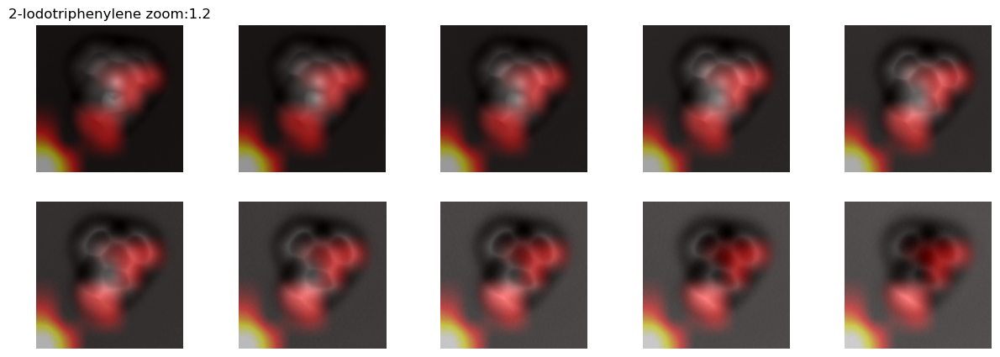

In [29]:
THRESHOLD = 0.9

ALPHA = 0.5
path = f'/home/{USER}/EXPERIMENTAL_IMAGES/RAW/2-Iodotriphenylene_88955426'

zoom_list = [ 0.7, 0.8, 0.9, 1, 1.1, 1.2]

for i, ZOOM in enumerate(zoom_list):

    exp_img, heatmap = compute_gradcam_figure(path, zoom = ZOOM, threshold = THRESHOLD, verbose=False)

    #10 images
    f, axarr = plt.subplots(2,5, figsize=(15, 5))
    axarr[0,0].imshow(exp_img[0], cmap = 'gray')
    axarr[0,1].imshow(exp_img[1], cmap = 'gray')
    axarr[0,2].imshow(exp_img[2], cmap = 'gray')
    axarr[0,3].imshow(exp_img[3], cmap = 'gray')
    axarr[0,4].imshow(exp_img[4], cmap = 'gray')
    axarr[1,0].imshow(exp_img[5], cmap = 'gray')
    axarr[1,1].imshow(exp_img[6], cmap = 'gray')
    axarr[1,2].imshow(exp_img[7], cmap = 'gray')
    axarr[1,3].imshow(exp_img[8], cmap = 'gray')
    axarr[1,4].imshow(exp_img[9], cmap = 'gray')
    
    axarr[0,0].set_title(f'2-Iodotriphenylene zoom:{ZOOM}')


    for i in range(2):
        for j in range(5):
            axarr[i,j].axis('off')
            axarr[i,j].imshow(heatmap, cmap='hot', alpha=ALPHA)
    plt.show()
    plt.close()


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:01<00:00, 12.75it/s]


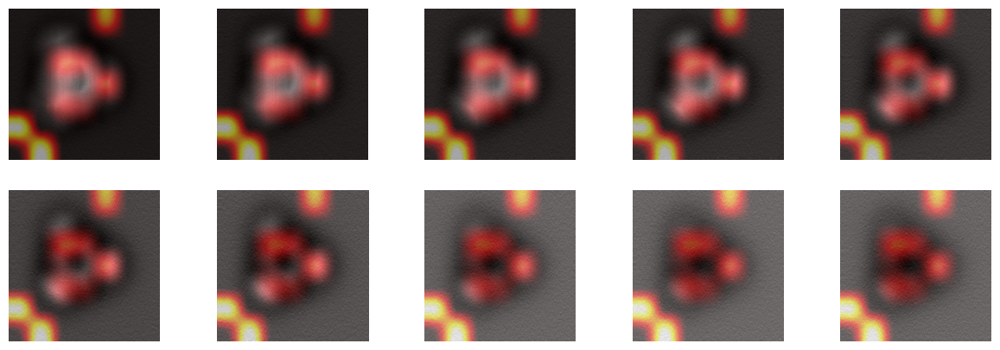

In [27]:
THRESHOLD = 0.9
ALPHA = 0.5
ZOOM = 1

path = f'/home/{USER}/EXPERIMENTAL_IMAGES/RAW/1-Bromo-3,5-dichlorobenzene'

exp_img, heatmap = compute_gradcam_figure(path, zoom = ZOOM, threshold = THRESHOLD)

#10 images
f, axarr = plt.subplots(2,5, figsize=(15, 5))
axarr[0,0].imshow(exp_img[0], cmap = 'gray')
axarr[0,1].imshow(exp_img[1], cmap = 'gray')
axarr[0,2].imshow(exp_img[2], cmap = 'gray')
axarr[0,3].imshow(exp_img[3], cmap = 'gray')
axarr[0,4].imshow(exp_img[4], cmap = 'gray')
axarr[1,0].imshow(exp_img[5], cmap = 'gray')
axarr[1,1].imshow(exp_img[6], cmap = 'gray')
axarr[1,2].imshow(exp_img[7], cmap = 'gray')
axarr[1,3].imshow(exp_img[8], cmap = 'gray')
axarr[1,4].imshow(exp_img[9], cmap = 'gray')


for i in range(2):
    for j in range(5):
        axarr[i,j].axis('off')
        axarr[i,j].imshow(heatmap, cmap='hot', alpha=ALPHA)

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 16.96it/s]


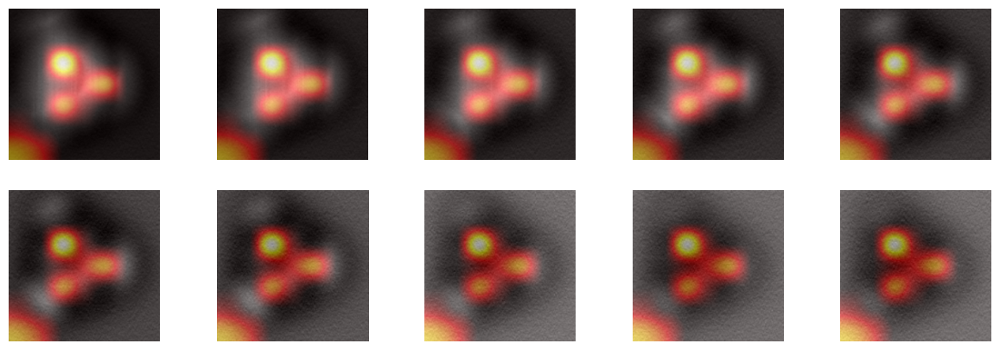

In [36]:
THRESHOLD = 0.9
ALPHA = 0.5
ZOOM = 1.4

path = f'/home/{USER}/EXPERIMENTAL_IMAGES/RAW/1-Bromo-3,5-dichlorobenzene'

exp_img, heatmap = compute_gradcam_figure(path, zoom = ZOOM, threshold = THRESHOLD)

#10 images
f, axarr = plt.subplots(2,5, figsize=(15, 5))
axarr[0,0].imshow(exp_img[0], cmap = 'gray')
axarr[0,1].imshow(exp_img[1], cmap = 'gray')
axarr[0,2].imshow(exp_img[2], cmap = 'gray')
axarr[0,3].imshow(exp_img[3], cmap = 'gray')
axarr[0,4].imshow(exp_img[4], cmap = 'gray')
axarr[1,0].imshow(exp_img[5], cmap = 'gray')
axarr[1,1].imshow(exp_img[6], cmap = 'gray')
axarr[1,2].imshow(exp_img[7], cmap = 'gray')
axarr[1,3].imshow(exp_img[8], cmap = 'gray')
axarr[1,4].imshow(exp_img[9], cmap = 'gray')


for i in range(2):
    for j in range(5):
        axarr[i,j].axis('off')
        axarr[i,j].imshow(heatmap, cmap='hot', alpha=ALPHA)

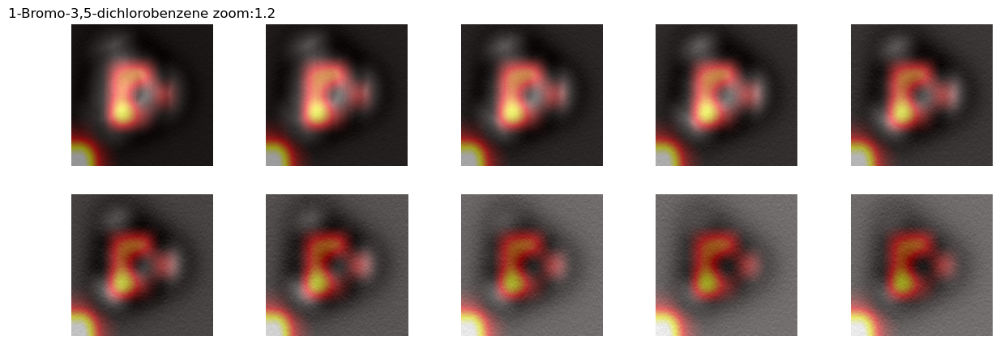

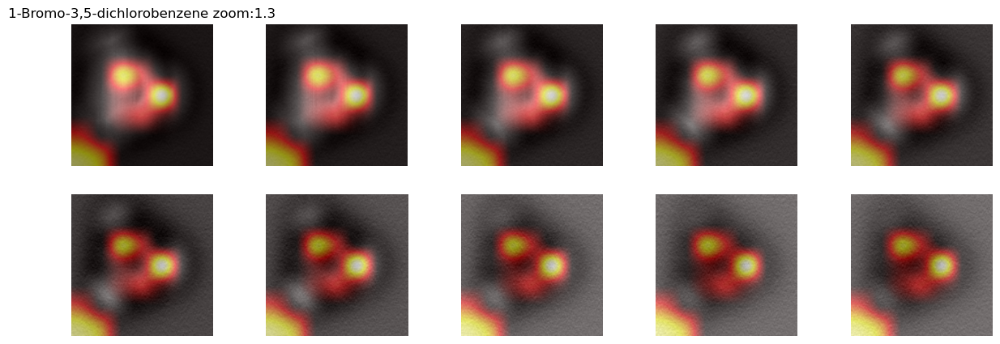

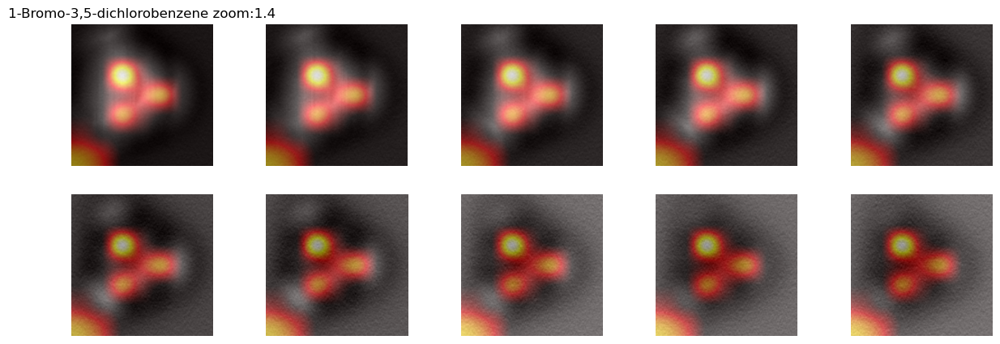

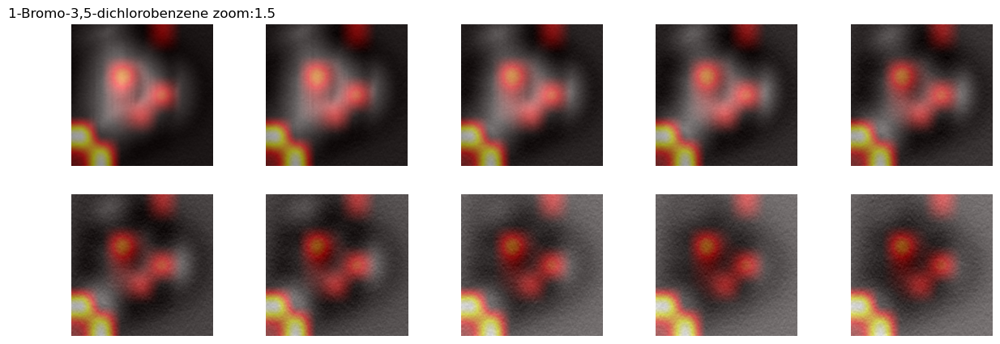

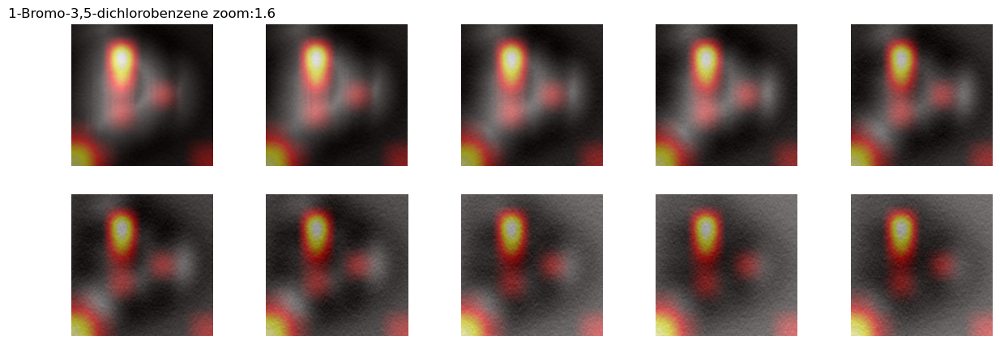

In [30]:
THRESHOLD = 0.9
ALPHA = 0.5
path = f'/home/{USER}/EXPERIMENTAL_IMAGES/RAW/1-Bromo-3,5-dichlorobenzene'

zoom_list = [ 1.2, 1.3, 1.4, 1.5, 1.6]

for i, ZOOM in enumerate(zoom_list):

    exp_img, heatmap = compute_gradcam_figure(path, zoom = ZOOM, threshold = THRESHOLD, verbose=False)

    #10 images
    f, axarr = plt.subplots(2,5, figsize=(15, 5))
    axarr[0,0].imshow(exp_img[0], cmap = 'gray')
    axarr[0,1].imshow(exp_img[1], cmap = 'gray')
    axarr[0,2].imshow(exp_img[2], cmap = 'gray')
    axarr[0,3].imshow(exp_img[3], cmap = 'gray')
    axarr[0,4].imshow(exp_img[4], cmap = 'gray')
    axarr[1,0].imshow(exp_img[5], cmap = 'gray')
    axarr[1,1].imshow(exp_img[6], cmap = 'gray')
    axarr[1,2].imshow(exp_img[7], cmap = 'gray')
    axarr[1,3].imshow(exp_img[8], cmap = 'gray')
    axarr[1,4].imshow(exp_img[9], cmap = 'gray')
    
    axarr[0,0].set_title(f'1-Bromo-3,5-dichlorobenzene zoom:{ZOOM}')


    for i in range(2):
        for j in range(5):
            axarr[i,j].axis('off')
            axarr[i,j].imshow(heatmap, cmap='hot', alpha=ALPHA)
    plt.show()
    plt.close()


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 18/18 [00:01<00:00, 17.12it/s]


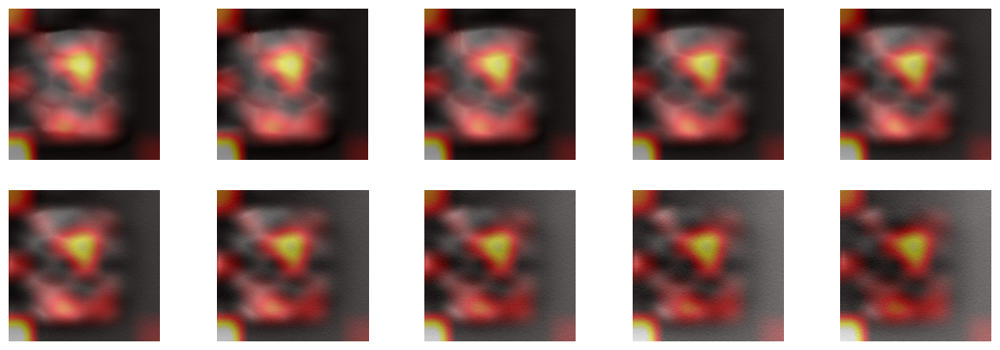

In [38]:
THRESHOLD = 0.9
ALPHA = 0.5
ZOOM = 1

path = f'/home/{USER}/EXPERIMENTAL_IMAGES/RAW/Perylenetetracarboxylic_dianhydride_PTCDA'

exp_img, heatmap = compute_gradcam_figure(path, zoom = ZOOM, threshold = THRESHOLD)

#10 images
f, axarr = plt.subplots(2,5, figsize=(15, 5))
axarr[0,0].imshow(exp_img[0], cmap = 'gray')
axarr[0,1].imshow(exp_img[1], cmap = 'gray')
axarr[0,2].imshow(exp_img[2], cmap = 'gray')
axarr[0,3].imshow(exp_img[3], cmap = 'gray')
axarr[0,4].imshow(exp_img[4], cmap = 'gray')
axarr[1,0].imshow(exp_img[5], cmap = 'gray')
axarr[1,1].imshow(exp_img[6], cmap = 'gray')
axarr[1,2].imshow(exp_img[7], cmap = 'gray')
axarr[1,3].imshow(exp_img[8], cmap = 'gray')
axarr[1,4].imshow(exp_img[9], cmap = 'gray')


for i in range(2):
    for j in range(5):
        axarr[i,j].axis('off')
        axarr[i,j].imshow(heatmap, cmap='hot', alpha=ALPHA)

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 17.04it/s]


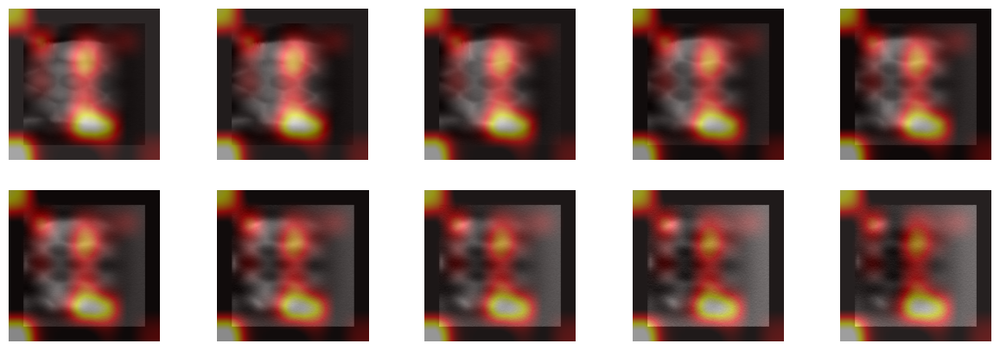

In [39]:
THRESHOLD = 0.9
ALPHA = 0.5
ZOOM = 0.8

path = f'/home/{USER}/EXPERIMENTAL_IMAGES/RAW/Perylenetetracarboxylic_dianhydride_PTCDA'

exp_img, heatmap = compute_gradcam_figure(path, zoom = ZOOM, threshold = THRESHOLD)

#10 images
f, axarr = plt.subplots(2,5, figsize=(15, 5))
axarr[0,0].imshow(exp_img[0], cmap = 'gray')
axarr[0,1].imshow(exp_img[1], cmap = 'gray')
axarr[0,2].imshow(exp_img[2], cmap = 'gray')
axarr[0,3].imshow(exp_img[3], cmap = 'gray')
axarr[0,4].imshow(exp_img[4], cmap = 'gray')
axarr[1,0].imshow(exp_img[5], cmap = 'gray')
axarr[1,1].imshow(exp_img[6], cmap = 'gray')
axarr[1,2].imshow(exp_img[7], cmap = 'gray')
axarr[1,3].imshow(exp_img[8], cmap = 'gray')
axarr[1,4].imshow(exp_img[9], cmap = 'gray')


for i in range(2):
    for j in range(5):
        axarr[i,j].axis('off')
        axarr[i,j].imshow(heatmap, cmap='hot', alpha=ALPHA)

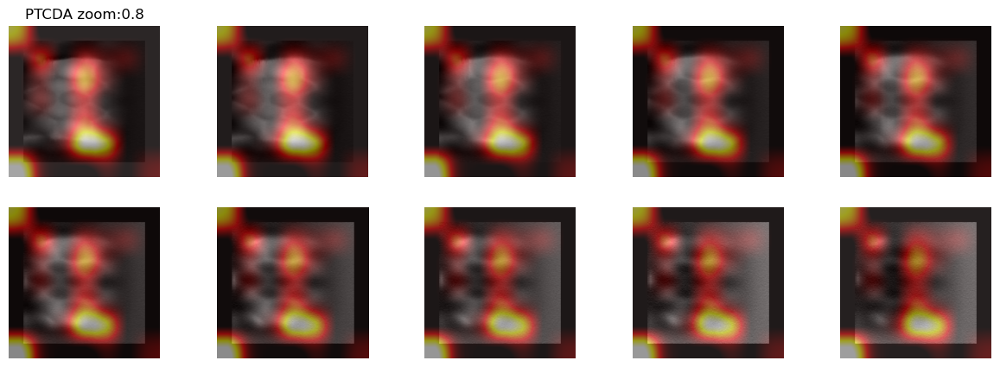

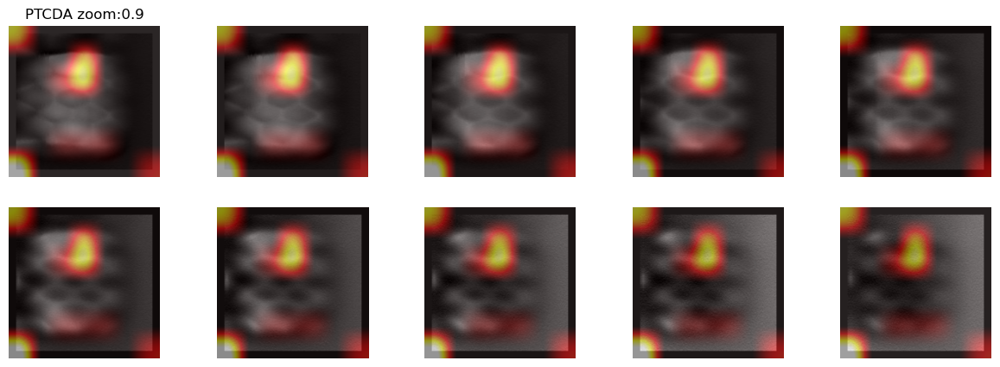

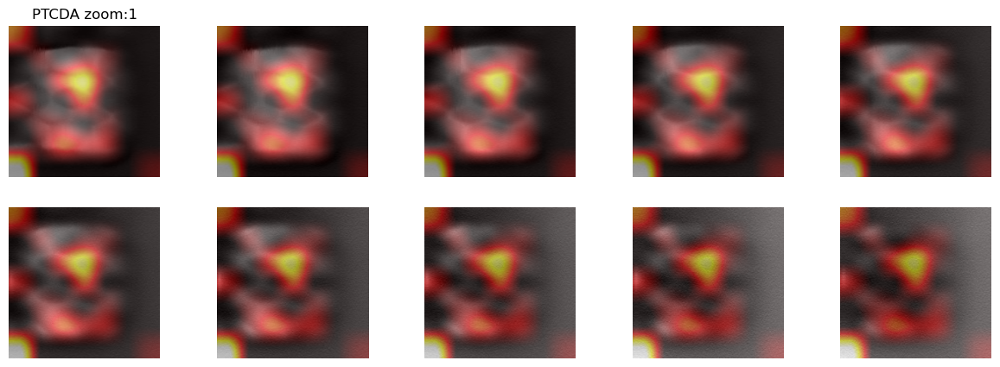

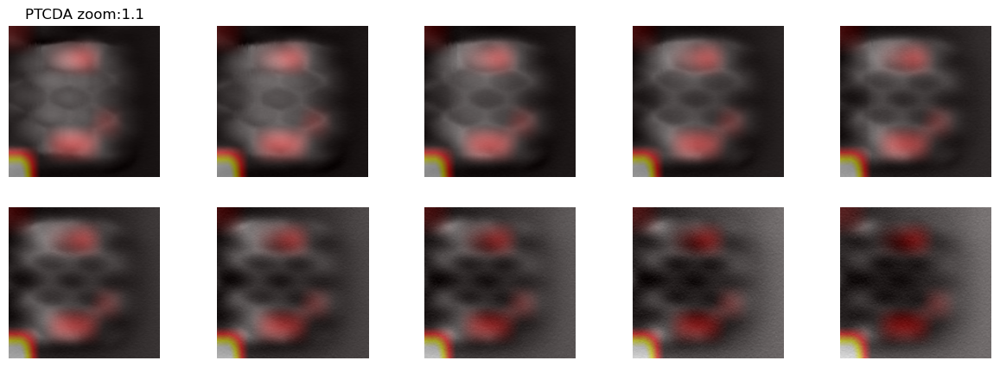

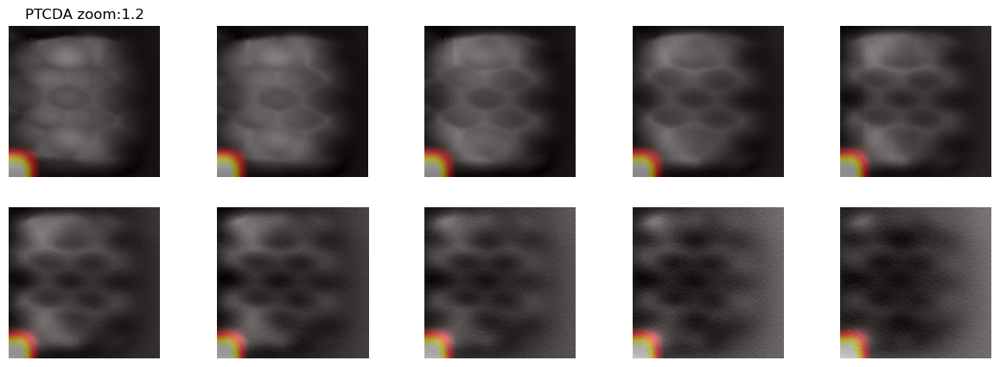

In [31]:
THRESHOLD = 0.9
ALPHA = 0.5

path = f'/home/{USER}/EXPERIMENTAL_IMAGES/RAW/Perylenetetracarboxylic_dianhydride_PTCDA'
zoom_list = [0.8, 0.9, 1, 1.1, 1.2]

for i, ZOOM in enumerate(zoom_list):

    exp_img, heatmap = compute_gradcam_figure(path, zoom = ZOOM, threshold = THRESHOLD, verbose=False)

    #10 images
    f, axarr = plt.subplots(2,5, figsize=(15, 5))
    axarr[0,0].imshow(exp_img[0], cmap = 'gray')
    axarr[0,1].imshow(exp_img[1], cmap = 'gray')
    axarr[0,2].imshow(exp_img[2], cmap = 'gray')
    axarr[0,3].imshow(exp_img[3], cmap = 'gray')
    axarr[0,4].imshow(exp_img[4], cmap = 'gray')
    axarr[1,0].imshow(exp_img[5], cmap = 'gray')
    axarr[1,1].imshow(exp_img[6], cmap = 'gray')
    axarr[1,2].imshow(exp_img[7], cmap = 'gray')
    axarr[1,3].imshow(exp_img[8], cmap = 'gray')
    axarr[1,4].imshow(exp_img[9], cmap = 'gray')
    
    axarr[0,0].set_title(f'PTCDA zoom:{ZOOM}')


    for i in range(2):
        for j in range(5):
            axarr[i,j].axis('off')
            axarr[i,j].imshow(heatmap, cmap='hot', alpha=ALPHA)
    plt.show()
    plt.close()

## Theoretical images

### Theoretical image 2-Bromo-4-chloro-3-iodopyridine

In [26]:
CID=59332995
path = test_df[test_df['CID']==CID]['path'].iloc[0]
print(test_df[test_df['CID']==CID])
path

                                                     path       CID  \
577689  /scratch/dataset/quam/K-1/Conformer3D_CID_5933...  59332995   

                      SMILES  \
577689  C1=CN=C(C(=C1Cl)I)Br   

                                                morgan_fp split  corrugation  
577689  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...  test       0.0002  


'/scratch/dataset/quam/K-1/Conformer3D_CID_59332995_K040_Amp040'

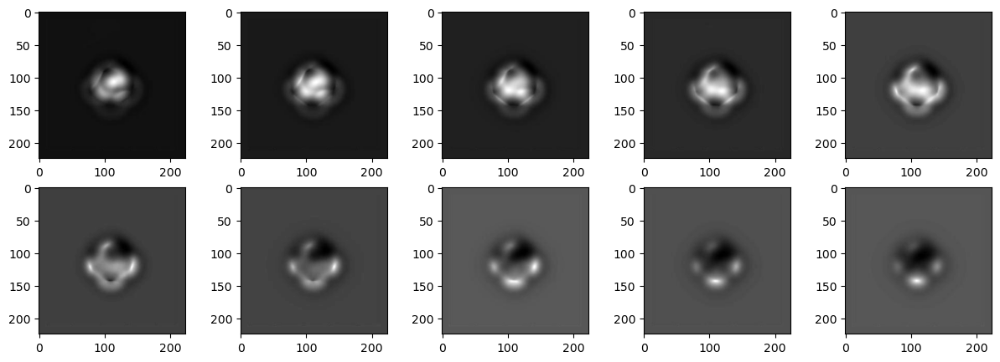

In [15]:
sorted(glob.glob(os.path.join(path,'*')))
exp_img = load_exp_img_stack(path, dimensions = [224,224], zoom=0.9)
#10 images
f, axarr = plt.subplots(2,5, figsize=(15, 5))
axarr[0,0].imshow(exp_img[0], cmap = 'gray')
axarr[0,1].imshow(exp_img[1], cmap = 'gray')
axarr[0,2].imshow(exp_img[2], cmap = 'gray')
axarr[0,3].imshow(exp_img[3], cmap = 'gray')
axarr[0,4].imshow(exp_img[4], cmap = 'gray')
axarr[1,0].imshow(exp_img[5], cmap = 'gray')
axarr[1,1].imshow(exp_img[6], cmap = 'gray')
axarr[1,2].imshow(exp_img[7], cmap = 'gray')
axarr[1,3].imshow(exp_img[8], cmap = 'gray')
axarr[1,4].imshow(exp_img[9], cmap = 'gray')

(-0.5, 223.5, 223.5, -0.5)

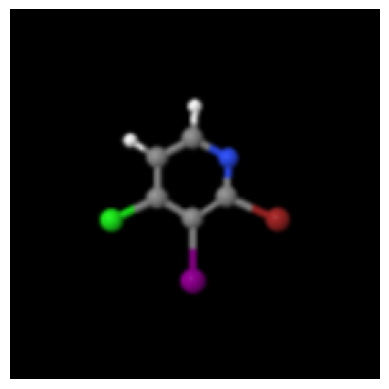

In [32]:
img = load_jmol_image(CID, dimension=[224,224], zoom=0.6)
plt.imshow(img)
plt.axis('off')

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:01<00:00, 11.77it/s]


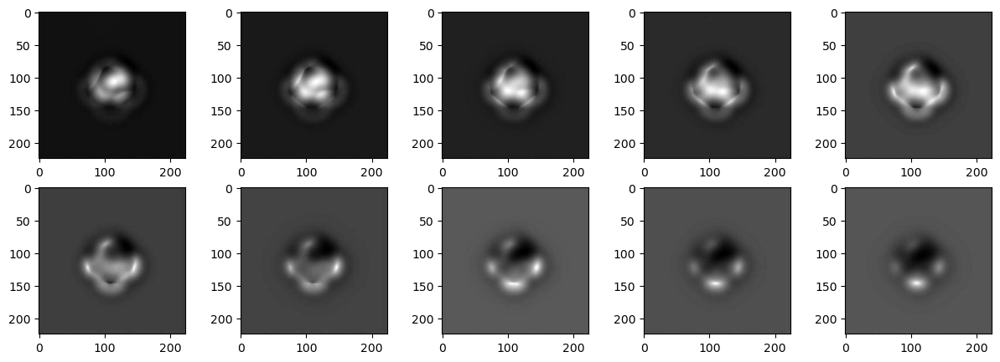

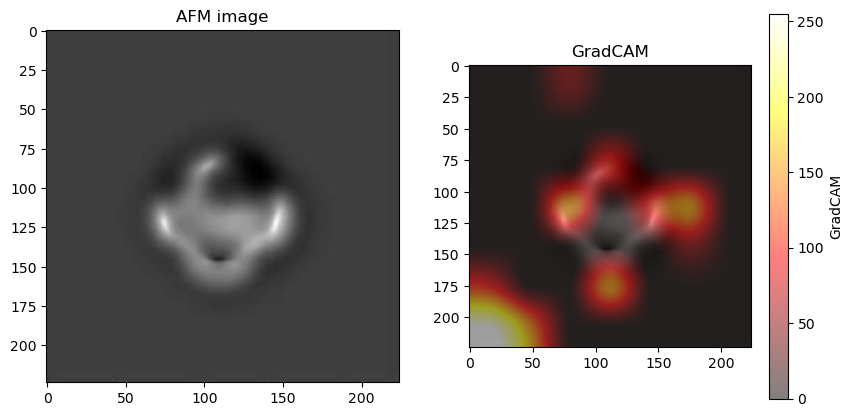

In [16]:

exp_img = load_exp_img_stack(path, dimensions = [224,224], zoom=1)
#10 images
f, axarr = plt.subplots(2,5, figsize=(15, 5))
axarr[0,0].imshow(exp_img[0], cmap = 'gray')
axarr[0,1].imshow(exp_img[1], cmap = 'gray')
axarr[0,2].imshow(exp_img[2], cmap = 'gray')
axarr[0,3].imshow(exp_img[3], cmap = 'gray')
axarr[0,4].imshow(exp_img[4], cmap = 'gray')
axarr[1,0].imshow(exp_img[5], cmap = 'gray')
axarr[1,1].imshow(exp_img[6], cmap = 'gray')
axarr[1,2].imshow(exp_img[7], cmap = 'gray')
axarr[1,3].imshow(exp_img[8], cmap = 'gray')
axarr[1,4].imshow(exp_img[9], cmap = 'gray')
# Additionally we can make the option of mapping to zero all values
# smaller than some threshold


THRESHOLD= 0.9
img = exp_img.unsqueeze(0)
# get the most likely prediction of the model
pred = model_gradcam(img.to(device))
fp_pred = (torch.sigmoid(pred) > 0.5).squeeze()

fp_index_arr = fp_pred.nonzero().detach().cpu().numpy().squeeze()

mask_list = list()
for class_index in tqdm(fp_index_arr):
        mask = np.array(gradcam(model_gradcam, img, class_index, device=device))
    
        mask = (mask > THRESHOLD)*mask
        mask_list.append(mask)
        
mask_list = np.array(mask_list)
mask_mean = mask_list.mean(axis=0)
mask_normalized = mask_mean/np.max(mask_mean)


# Convert NumPy array to PIL Image
image_pil = Image.fromarray((mask_normalized * 255).astype(np.uint8))

# Resize PIL Image
new_size = (exp_img.size(2), exp_img.size(2))   # (width, height)
image_pil_resized = image_pil.resize(new_size)

# Convert PIL Image back to NumPy array
image_array_resized = np.array(image_pil_resized)

image = img[0, 5, :, :].cpu().numpy()
fig, ax = plt.subplots(1,2, figsize=(10, 5))
ax[0].imshow(image, cmap='gray')
ax[0].set_title('AFM image')

ax[1].imshow(image, cmap='gray')
grad_plot = ax[1].imshow(image_array_resized, cmap='hot', alpha=0.5)
ax[1].set_title('GradCAM')
cbar = fig.colorbar(grad_plot, ax=ax[1])
cbar.set_label('GradCAM')

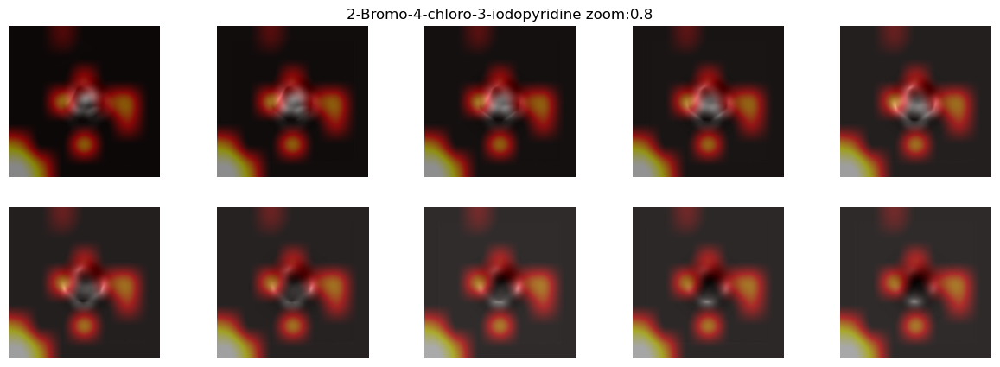

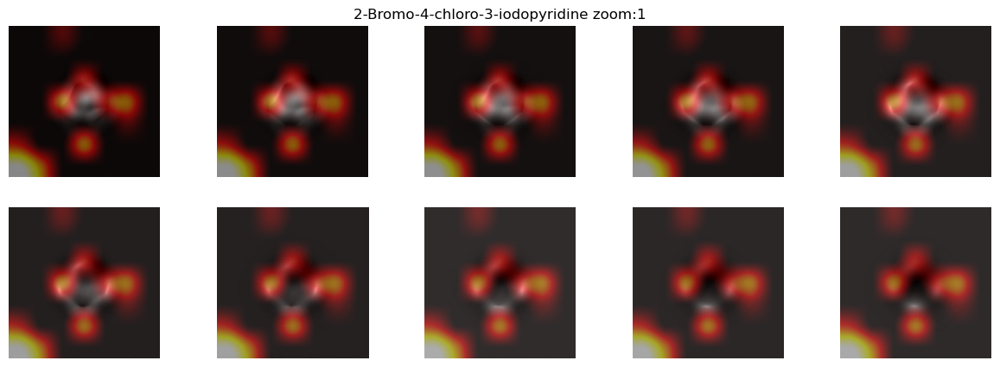

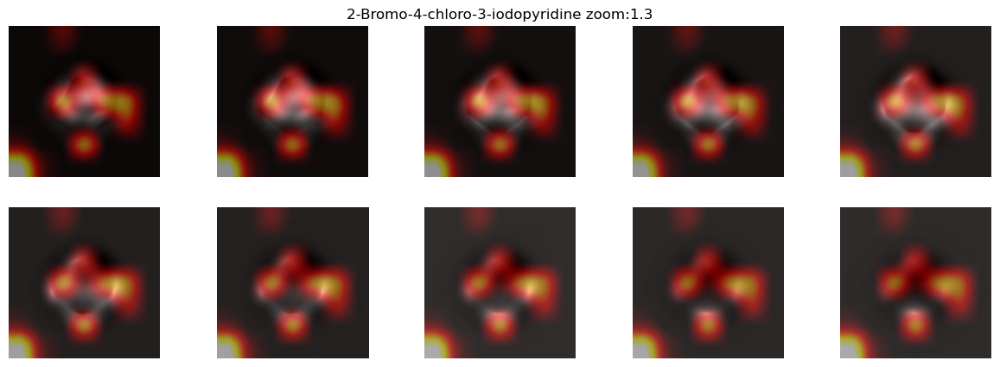

In [56]:
THRESHOLD = 0.9
ALPHA = 0.5
path = '/scratch/dataset/quam/K-1/Conformer3D_CID_59332995_K040_Amp040'

zoom_list = [ 0.8, 1, 1.3]

for i, ZOOM in enumerate(zoom_list):

    exp_img, heatmap = compute_gradcam_figure(path, zoom = ZOOM, threshold = THRESHOLD, verbose=False)

    #10 images
    f, axarr = plt.subplots(2,5, figsize=(15, 5))
    axarr[0,0].imshow(exp_img[0], cmap = 'gray')
    axarr[0,1].imshow(exp_img[1], cmap = 'gray')
    axarr[0,2].imshow(exp_img[2], cmap = 'gray')
    axarr[0,3].imshow(exp_img[3], cmap = 'gray')
    axarr[0,4].imshow(exp_img[4], cmap = 'gray')
    axarr[1,0].imshow(exp_img[5], cmap = 'gray')
    axarr[1,1].imshow(exp_img[6], cmap = 'gray')
    axarr[1,2].imshow(exp_img[7], cmap = 'gray')
    axarr[1,3].imshow(exp_img[8], cmap = 'gray')
    axarr[1,4].imshow(exp_img[9], cmap = 'gray')
    
    axarr[0,2].set_title(f'2-Bromo-4-chloro-3-iodopyridine zoom:{ZOOM}')


    for i in range(2):
        for j in range(5):
            axarr[i,j].axis('off')
            axarr[i,j].imshow(heatmap, cmap='hot', alpha=ALPHA)
    plt.show()
    plt.close()


### Theoretical image: N-(3-hydrazinylidene-1H-inden-2-ylidene)hydroxylamine

In [57]:
CID = 137221883
path = test_df[test_df['CID']==CID]['path'].iloc[0]
print(test_df[test_df['CID']==CID])
path

                                                    path        CID  \
17262  /scratch/dataset/quam/K-1/Conformer3D_CID_1372...  137221883   

                         SMILES  \
17262  C1C2=CC=CC=C2C(=NN)C1=NO   

                                               morgan_fp split  corrugation  
17262  [0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...  test       0.0009  


'/scratch/dataset/quam/K-1/Conformer3D_CID_137221883_K040_Amp040'

(-0.5, 223.5, 223.5, -0.5)

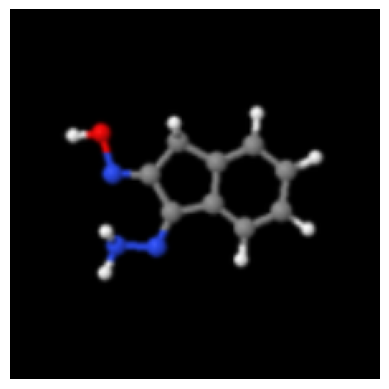

In [58]:
img = load_jmol_image(CID, dimension=[224,224], zoom=0.6)
plt.imshow(img)
plt.axis('off')

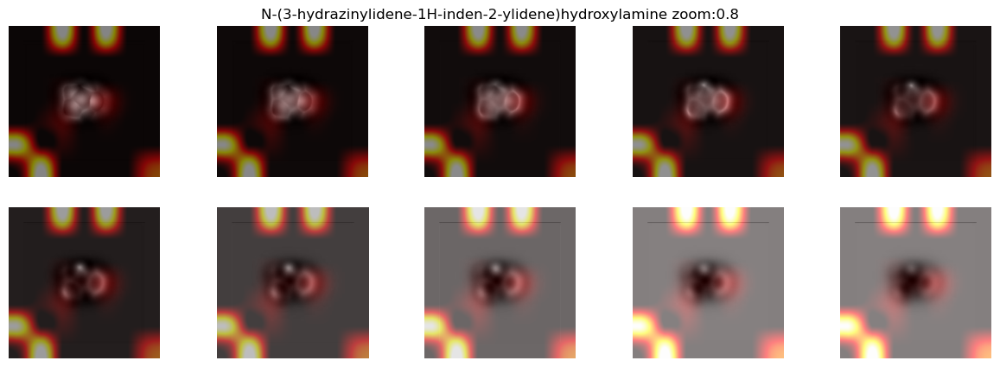

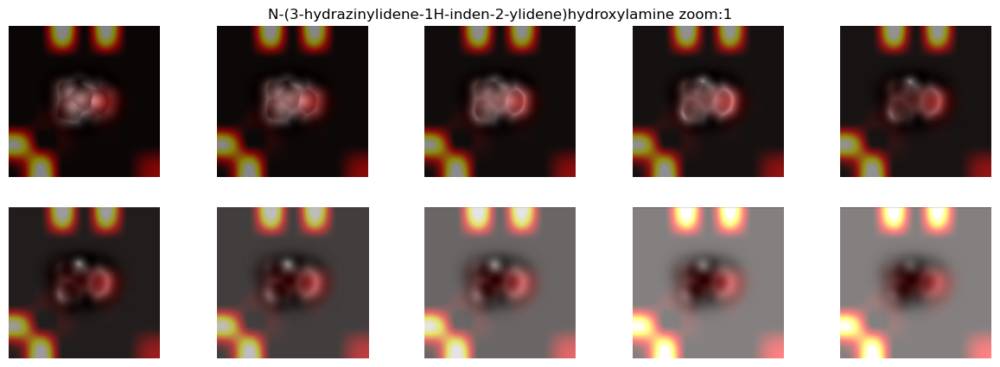

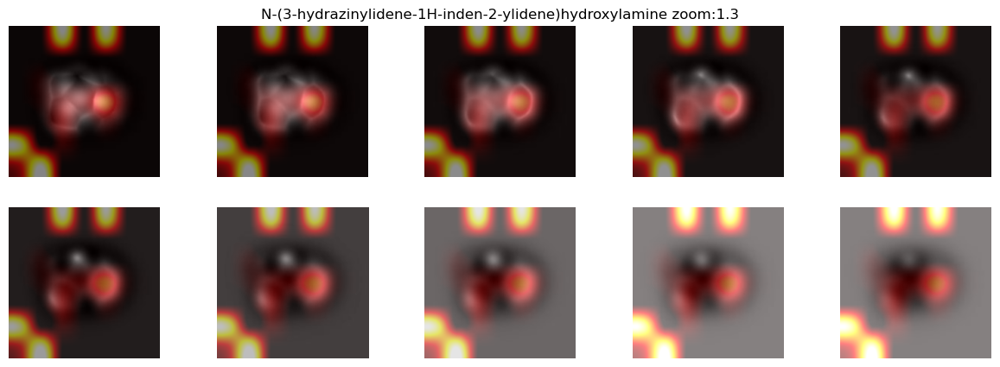

In [60]:
THRESHOLD = 0.9
ALPHA = 0.5
path = '/scratch/dataset/quam/K-1/Conformer3D_CID_137221883_K040_Amp040'

zoom_list = [ 0.8, 1, 1.3]

for i, ZOOM in enumerate(zoom_list):

    exp_img, heatmap = compute_gradcam_figure(path, zoom = ZOOM, threshold = THRESHOLD, verbose=False)

    #10 images
    f, axarr = plt.subplots(2,5, figsize=(15, 5))
    axarr[0,0].imshow(exp_img[0], cmap = 'gray')
    axarr[0,1].imshow(exp_img[1], cmap = 'gray')
    axarr[0,2].imshow(exp_img[2], cmap = 'gray')
    axarr[0,3].imshow(exp_img[3], cmap = 'gray')
    axarr[0,4].imshow(exp_img[4], cmap = 'gray')
    axarr[1,0].imshow(exp_img[5], cmap = 'gray')
    axarr[1,1].imshow(exp_img[6], cmap = 'gray')
    axarr[1,2].imshow(exp_img[7], cmap = 'gray')
    axarr[1,3].imshow(exp_img[8], cmap = 'gray')
    axarr[1,4].imshow(exp_img[9], cmap = 'gray')
    
    axarr[0,2].set_title(f'N-(3-hydrazinylidene-1H-inden-2-ylidene)hydroxylamine zoom:{ZOOM}')


    for i in range(2):
        for j in range(5):
            axarr[i,j].axis('off')
            axarr[i,j].imshow(heatmap, cmap='hot', alpha=ALPHA)
    plt.show()
    plt.close()

### Grad-CAM mdbpc_cis_gas Manu

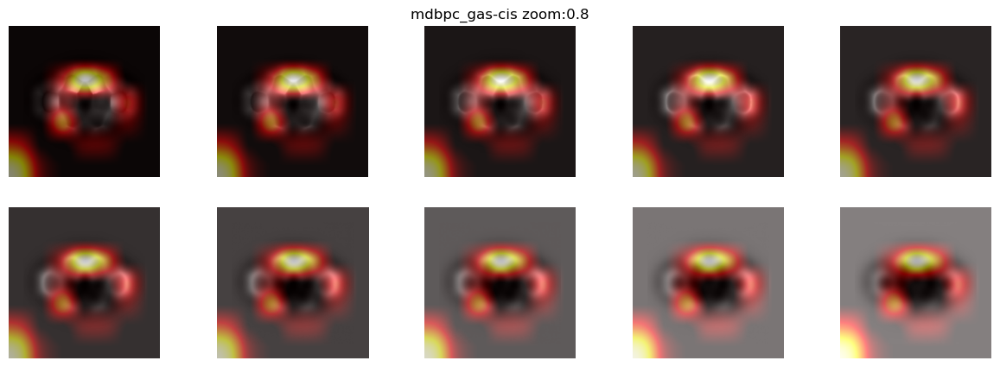

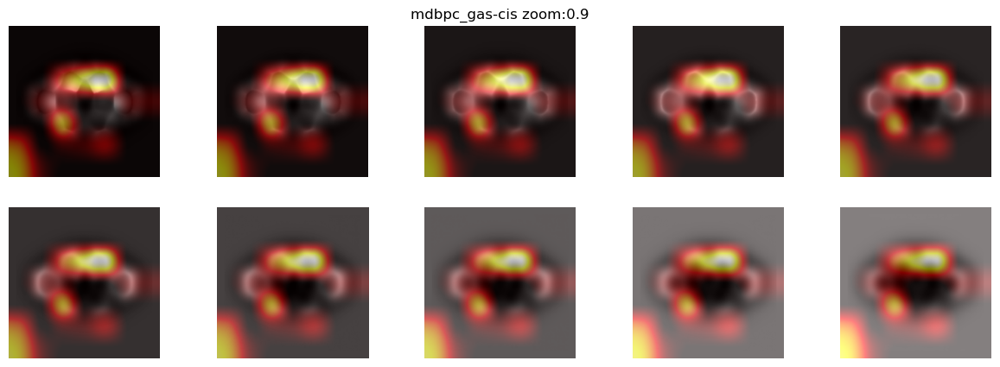

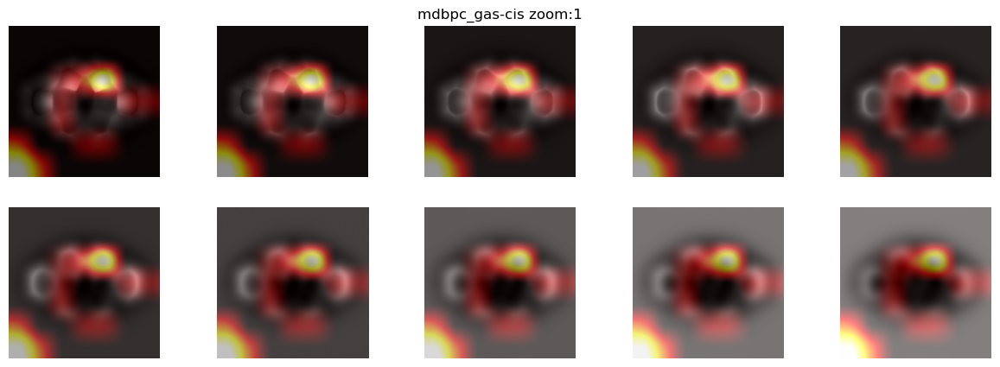

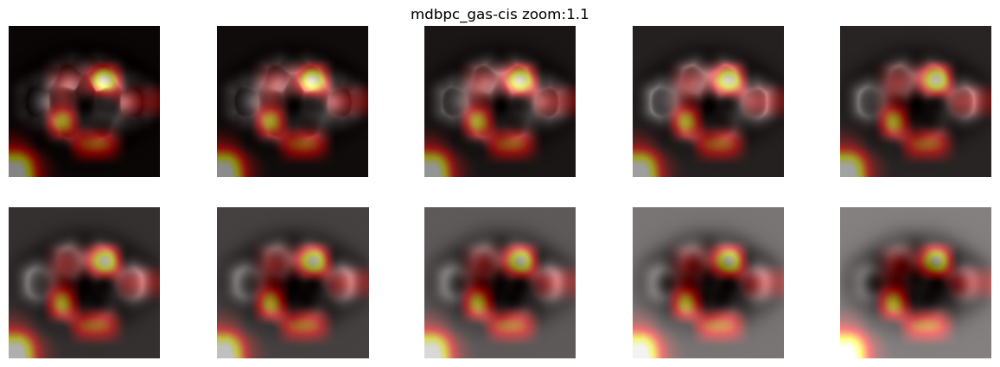

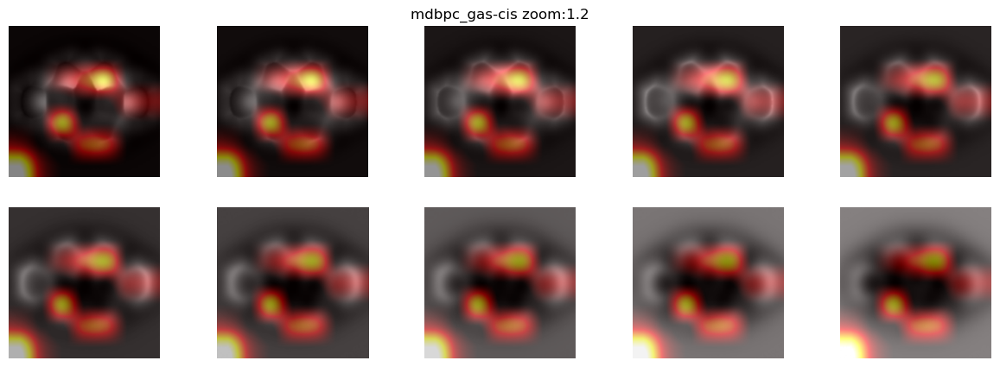

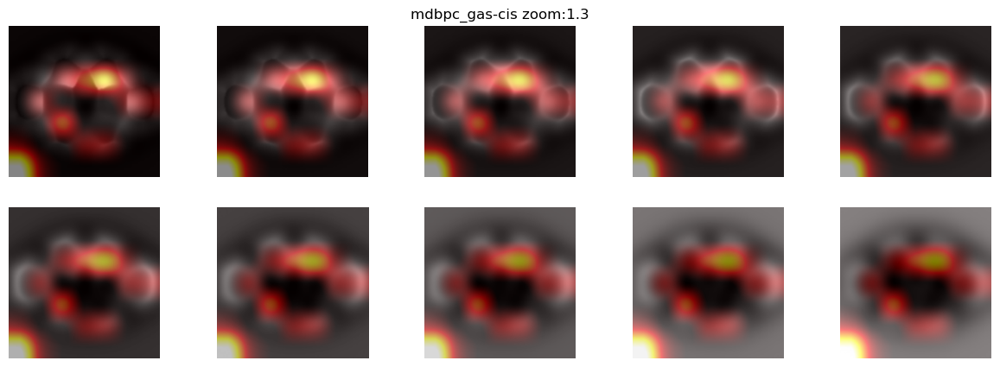

In [13]:
THRESHOLD = 0.9
ALPHA = 0.5
path = f'/home/{USER}/mDBPc_simulations_ppm_jaime/PROCESSED/mdbpc_gas-cis_manu' 

zoom_list = [ 0.8, 0.9, 1, 1.1, 1.2, 1.3]

for i, ZOOM in enumerate(zoom_list):

    exp_img, heatmap = compute_gradcam_figure(path, zoom = ZOOM, threshold = THRESHOLD, verbose=False)

    #10 images
    f, axarr = plt.subplots(2,5, figsize=(15, 5))
    axarr[0,0].imshow(exp_img[0], cmap = 'gray')
    axarr[0,1].imshow(exp_img[1], cmap = 'gray')
    axarr[0,2].imshow(exp_img[2], cmap = 'gray')
    axarr[0,3].imshow(exp_img[3], cmap = 'gray')
    axarr[0,4].imshow(exp_img[4], cmap = 'gray')
    axarr[1,0].imshow(exp_img[5], cmap = 'gray')
    axarr[1,1].imshow(exp_img[6], cmap = 'gray')
    axarr[1,2].imshow(exp_img[7], cmap = 'gray')
    axarr[1,3].imshow(exp_img[8], cmap = 'gray')
    axarr[1,4].imshow(exp_img[9], cmap = 'gray')
    
    axarr[0,2].set_title(f'mdbpc_gas-cis zoom:{ZOOM}')


    for i in range(2):
        for j in range(5):
            axarr[i,j].axis('off')
            axarr[i,j].imshow(heatmap, cmap='hot', alpha=ALPHA)
    plt.show()
    plt.close()
